# 实验5 图像的邻域运算




In [2]:
#安装使用所需要的第三方库
%pip install matplotlib --upgrade
%pip install numpy --upgrade
%pip install pillow --upgrade
%pip install pydicom

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
# 解决matplotlib中文显示乱码问题
import matplotlib
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']  # 使用黑体或微软雅黑
matplotlib.rcParams['axes.unicode_minus'] = False  # 解决负号显示问题

# 也可以直接设置字体
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

print("已配置中文字体支持，解决乱码问题")

已配置中文字体支持，解决乱码问题


In [4]:
%matplotlib inline
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt 
from pydicom import dcmread

## 1.邻域的生成

邻域生成的作用，将邻域运算转为通道运算，从而对许多图像邻域处理可以使用矩阵运算和聚合运算。通过apply_along_axis()函数完成任意的邻域图像处理方法。

In [5]:
#简单的邻域生成方法
def make_neibor_simple(imgar,kernel_size=3,pad_value=0):
    #对mxn的数组以大小为kernel_size的邻域展开，以pad_value填充扩边
    # imgar 表示图像的mxn的数组
    # kernel_size 表示宽高相同的邻域大小，为奇数，默认是3x3邻域
    # pad_value 表示填充的值，用于保证展开前后数组尺寸相同，默认是0
    assert kernel_size%2==1
    assert imgar.ndim==2
    k=kernel_size//2
    h,w=imgar.shape[:2]
    padar=np.pad( imgar,pad_width=((k,k),(k,k)),mode='constant',constant_values=pad_value)
    neighbors=[padar[i:i+h,j:j+w] for i in range(kernel_size) for j in range(kernel_size)] 
    return np.dstack(neighbors)

In [6]:
#8邻域邻域生成示例
imgar=np.array([[1,2,3],
                [4,5,6],
                [7,8,9]])#输入图像
nbar=make_neibor_simple(imgar,kernel_size=3)#图像邻域生成调用
nbar.shape  #展开后尺寸不变，邻域展开的结果作为通道


#观察8邻域展开的结果，注意验证
print("nbar=",nbar)
#观察imgar在像素(0,0)处的展开结果，注意观察pad（填充）的效果
print("nbar[0,0]=",nbar[0,0]) 
#观察imgar在像素(1,1)和(1,2)处的展开结果
print("nbar[1,1]=",nbar[1,1])
print("nbar[1,2]=",nbar[1,2])

nbar= [[[0 0 0 0 1 2 0 4 5]
  [0 0 0 1 2 3 4 5 6]
  [0 0 0 2 3 0 5 6 0]]

 [[0 1 2 0 4 5 0 7 8]
  [1 2 3 4 5 6 7 8 9]
  [2 3 0 5 6 0 8 9 0]]

 [[0 4 5 0 7 8 0 0 0]
  [4 5 6 7 8 9 0 0 0]
  [5 6 0 8 9 0 0 0 0]]]
nbar[0,0]= [0 0 0 0 1 2 0 4 5]
nbar[1,1]= [1 2 3 4 5 6 7 8 9]
nbar[1,2]= [2 3 0 5 6 0 8 9 0]


在形态学运算中，需要按照不同形状进行邻域（结构化元素）的展开，可以对以上定义的邻域展开函数进行增强，得到可以支持结构元素的展开函数：

In [7]:
def make_neibor(imgar,kernel_sizes=3,pattern=None,pad_value=0):
    #对mxn大小的数组以kernel_sizes大小的邻域展开，kernel_size可以是一个奇数表示方形邻域，也可以是一个两个奇数元素的无组
    #pattern为一个kernel_sizes大小的0-1二维数组，表示邻域的形状，pattern的优先级大于kernel_sizes,如果都设置以pattern为主
    #带有常数值填充的
    if isinstance(pattern,np.ndarray) and pattern.ndim==2:
        kernel_sizes=pattern.shape
    else:
        if isinstance(kernel_sizes, int):
            kernel_sizes=kernel_sizes,kernel_sizes
            pattern=np.ones(kernel_sizes ,dtype=np.uint8)
        elif isinstance(kernel_sizes,tuple) and len(kernel_sizes)==2:
            pattern=np.ones(kernel_sizes ,dtype=np.uint8)
        else:
            raise Exception('wrong kernel type, kernel should be a int type or  a tuple of two int value')
    for k in kernel_sizes:#检查展开邻域是否为奇数
        assert k%2==1 
    pady=kernel_sizes[0]//2
    padx=kernel_sizes[1]//2

    h,w=imgar.shape[:2]
    if imgar.ndim==3:
        padar=np.pad( imgar,pad_width=((pady,pady),(padx,padx),(0,0)),mode='constant',constant_values=pad_value)
    else: #=2
        padar=np.pad( imgar,pad_width=((pady,pady),(padx,padx)),mode='constant',constant_values=pad_value)
    r,c=kernel_sizes
    neighbors=[padar[y:y+h,x:x+w]  for y in range(r) for x in range(c) if pattern[y,x]>0.5]
    return np.dstack(neighbors)

In [8]:
#按照8邻域模式
imgar=np.array([[1,2,3],
                [4,5,6],
                [7,8,9]])
nbar=make_neibor(imgar,kernel_sizes=3)
nbar.shape #展开后尺寸不变，邻域展开的结果作为通道
#展开
nbar
print("nbar.shape =",nbar.shape )
print("nbar=",nbar)

nbar.shape = (3, 3, 9)
nbar= [[[0 0 0 0 1 2 0 4 5]
  [0 0 0 1 2 3 4 5 6]
  [0 0 0 2 3 0 5 6 0]]

 [[0 1 2 0 4 5 0 7 8]
  [1 2 3 4 5 6 7 8 9]
  [2 3 0 5 6 0 8 9 0]]

 [[0 4 5 0 7 8 0 0 0]
  [4 5 6 7 8 9 0 0 0]
  [5 6 0 8 9 0 0 0 0]]]


In [9]:
#按照指定模式展开
imgar=np.array([[1,2,3],
                [4,5,6],
                [7,8,9]])
#创建一个十字形邻域模式
pt=np.array([[0,1,0],
             [1,1,1],
            [0,1,0]])
nbar=make_neibor(imgar,pattern=pt)
#注意观察最后一维，的长度为5，表示结构元素mask中的尺寸
print("nbar.shape =",nbar.shape )
print("nbar=",nbar)

nbar.shape = (3, 3, 5)
nbar= [[[0 0 1 2 4]
  [0 1 2 3 5]
  [0 2 3 0 6]]

 [[1 0 4 5 7]
  [2 4 5 6 8]
  [3 5 6 0 9]]

 [[4 0 7 8 0]
  [5 7 8 9 0]
  [6 8 9 0 0]]]


## 2.卷积运算

In [10]:
#定义一个卷积运算函数
def conv2d(grayimg,kernel):
    #卷积运算函数，对灰度图像完成卷积运算
    kernel_size=kernel.shape
    nbar=make_neibor(grayimg,kernel_sizes=kernel_size)
    return nbar.dot(kernel.flat) 

In [11]:
imgar=np.array([[1,2,3],
                [4,5,6],
                [7,8,9]])
#构造一个3x3，元素为1的卷积核
kernel=np.ones((3,3))
print('卷积核：\n', kernel)
#进行卷积运算，含义是求3x3邻域内元素的和
conv2d(imgar,kernel)

卷积核：
 [[1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]]


array([[12., 21., 16.],
       [27., 45., 33.],
       [24., 39., 28.]])

## 3.均值滤波

In [12]:
#均值滤波函数
def mean(imgar,size=3):
    nbar=make_neibor(imgar,size)
    return np.mean(nbar,axis=2,keepdims=False)

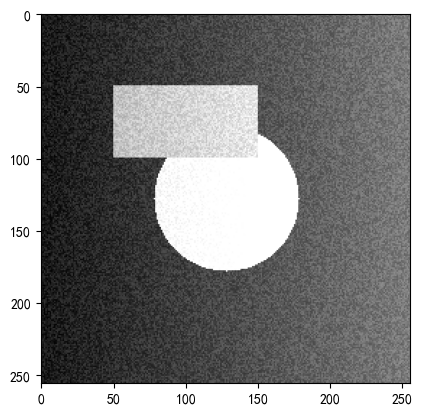

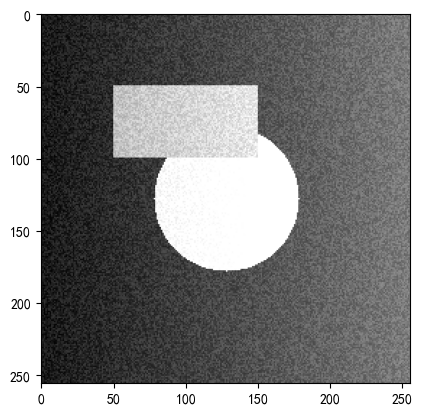

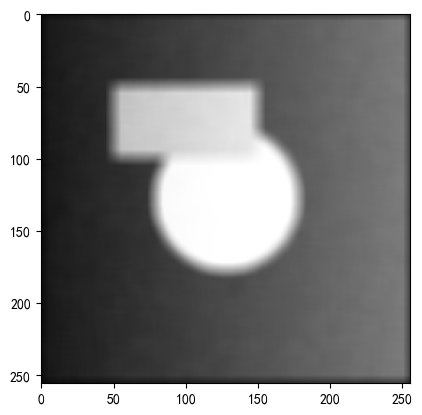

In [14]:
#均值滤波，使用自定义均值滤波函数，11×11邻域模板
#打开图像
img=Image.open('./images/lena256.png').convert('L')
imgar=np.array(img) #截取一个区域
#自定义均值滤波函数
m11ar=mean(imgar,size=11)
#显示原图
plt.imshow(imgar,cmap='gray',vmin=0,vmax=255) 
plt.show()
#均值滤波结果
plt.imshow(m11ar,cmap='gray',vmin=0,vmax=255)
plt.show()

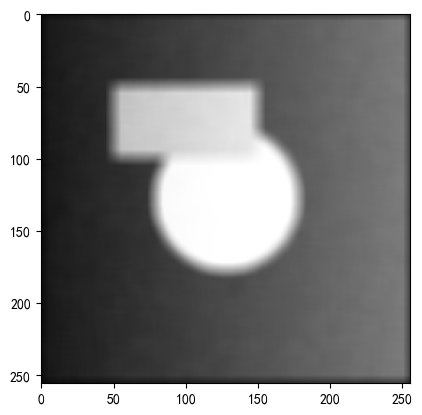

In [15]:
#使用卷积完成11×11均值滤波 
#构造一个均值滤波卷积核
kernel=np.full((11,11),1/121)
#进行卷积运算
img11x11=conv2d(imgar,kernel)
#显示结果
plt.imshow(img11x11,cmap='gray',vmin=0,vmax=255)
plt.show()

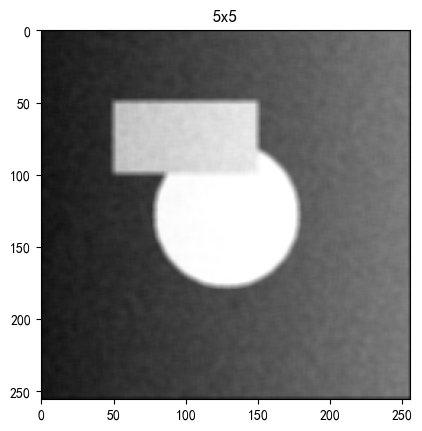

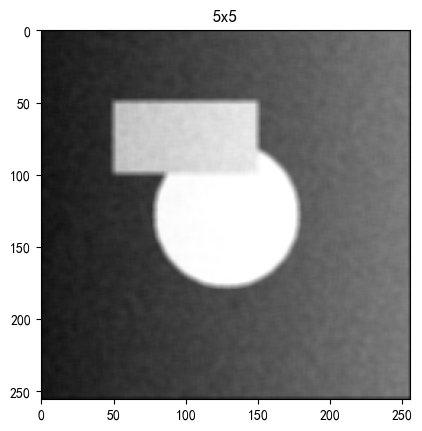

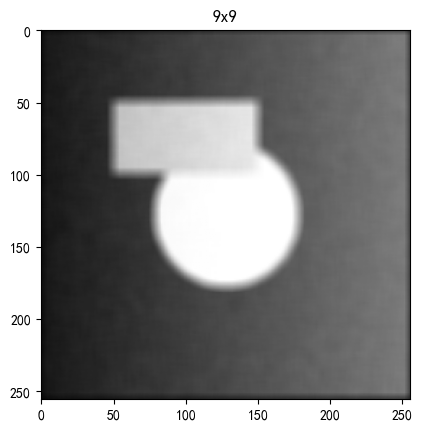

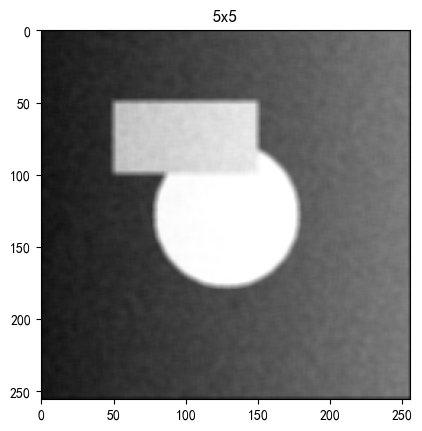

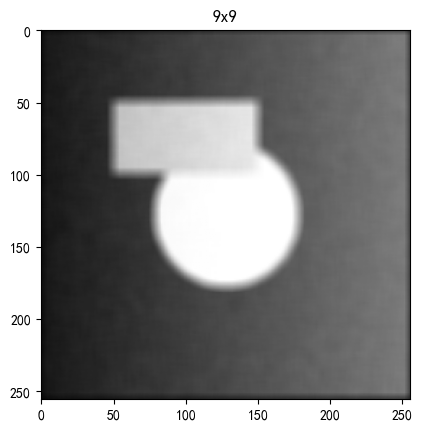

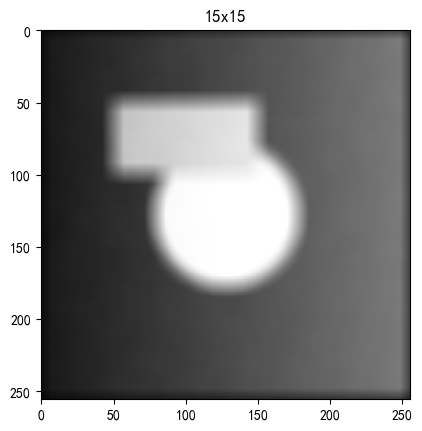

In [16]:
#观察不同尺寸的邻域下的均值滤波效果
m5ar=mean(imgar,5)#卷积核5*5
plt.title(f'5x5')
plt.imshow(m5ar,cmap='gray',vmin=0,vmax=255) 
plt.show()
m7ar=mean(imgar,9)#卷积核9*9
plt.title(f'9x9')
plt.imshow(m7ar,cmap='gray',vmin=0,vmax=255) 
plt.show()
m11ar=mean(imgar,15)#卷积核15*15
plt.title(f'15x15')
plt.imshow(m11ar,cmap='gray',vmin=0,vmax=255) 
plt.show()

## 4.高斯滤波

In [17]:
#高斯滤波核函数
def gaussian_kernel(ksize=3,sigma=1):
    d=ksize//2
    pos=np.linspace(-d,d,ksize)
    x,y=np.meshgrid(pos,pos,indexing='xy')
    kernel=np.exp((x*x+y*y)/(-2*sigma*sigma))/(2*np.pi*sigma*sigma)
    #归一化
    kernel=kernel/kernel.sum() 
    return kernel

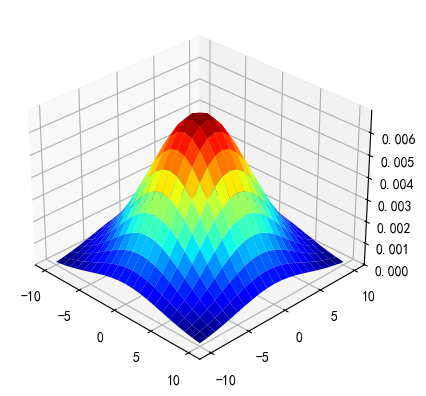

In [18]:
#生成一个21x21大小，标准差为5的高斯卷积核
gausskernel=gaussian_kernel(21,5)
#对高斯卷积核可视化
from mpl_toolkits.mplot3d import Axes3D
x = np.arange(-10,11,1)
y = np.arange(-10,11,1)
X,Y = np.meshgrid(x,y)
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
ax.view_init(elev=30,azim=-45,roll=0)
ax.plot_surface(X,Y ,gausskernel , cmap='jet')
plt.show()

gaussk5x5= [[0.02324684 0.03382395 0.03832756 0.03382395 0.02324684]
 [0.03382395 0.04921356 0.05576627 0.04921356 0.03382395]
 [0.03832756 0.05576627 0.06319146 0.05576627 0.03832756]
 [0.03382395 0.04921356 0.05576627 0.04921356 0.03382395]
 [0.02324684 0.03382395 0.03832756 0.03382395 0.02324684]]
gaussk9x9= [[0.00396525 0.00585009 0.00772325 0.00912394 0.00964517 0.00912394
  0.00772325 0.00585009 0.00396525]
 [0.00585009 0.00863087 0.01139442 0.01346091 0.01422991 0.01346091
  0.01139442 0.00863087 0.00585009]
 [0.00772325 0.01139442 0.01504283 0.017771   0.01878622 0.017771
  0.01504283 0.01139442 0.00772325]
 [0.00912394 0.01346091 0.017771   0.02099396 0.0221933  0.02099396
  0.017771   0.01346091 0.00912394]
 [0.00964517 0.01422991 0.01878622 0.0221933  0.02346115 0.0221933
  0.01878622 0.01422991 0.00964517]
 [0.00912394 0.01346091 0.017771   0.02099396 0.0221933  0.02099396
  0.017771   0.01346091 0.00912394]
 [0.00772325 0.01139442 0.01504283 0.017771   0.01878622 0.017771


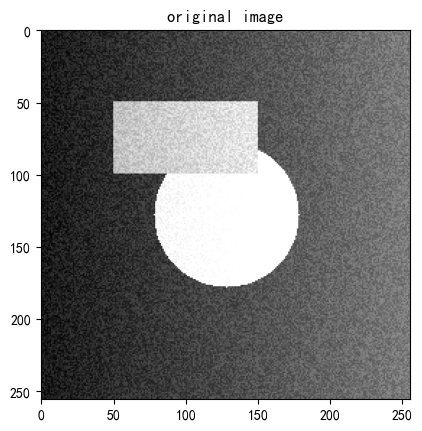

gaussk5x5= [[0.02324684 0.03382395 0.03832756 0.03382395 0.02324684]
 [0.03382395 0.04921356 0.05576627 0.04921356 0.03382395]
 [0.03832756 0.05576627 0.06319146 0.05576627 0.03832756]
 [0.03382395 0.04921356 0.05576627 0.04921356 0.03382395]
 [0.02324684 0.03382395 0.03832756 0.03382395 0.02324684]]
gaussk9x9= [[0.00396525 0.00585009 0.00772325 0.00912394 0.00964517 0.00912394
  0.00772325 0.00585009 0.00396525]
 [0.00585009 0.00863087 0.01139442 0.01346091 0.01422991 0.01346091
  0.01139442 0.00863087 0.00585009]
 [0.00772325 0.01139442 0.01504283 0.017771   0.01878622 0.017771
  0.01504283 0.01139442 0.00772325]
 [0.00912394 0.01346091 0.017771   0.02099396 0.0221933  0.02099396
  0.017771   0.01346091 0.00912394]
 [0.00964517 0.01422991 0.01878622 0.0221933  0.02346115 0.0221933
  0.01878622 0.01422991 0.00964517]
 [0.00912394 0.01346091 0.017771   0.02099396 0.0221933  0.02099396
  0.017771   0.01346091 0.00912394]
 [0.00772325 0.01139442 0.01504283 0.017771   0.01878622 0.017771


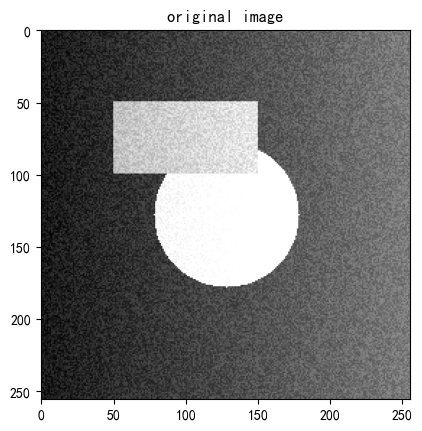

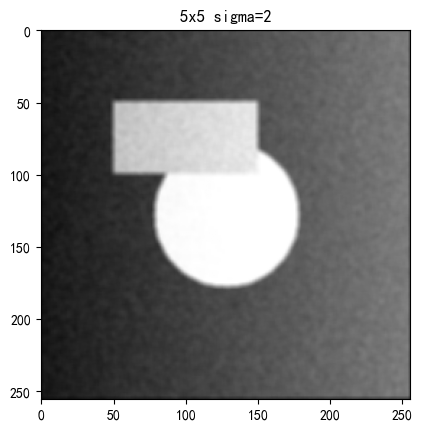

gaussk5x5= [[0.02324684 0.03382395 0.03832756 0.03382395 0.02324684]
 [0.03382395 0.04921356 0.05576627 0.04921356 0.03382395]
 [0.03832756 0.05576627 0.06319146 0.05576627 0.03832756]
 [0.03382395 0.04921356 0.05576627 0.04921356 0.03382395]
 [0.02324684 0.03382395 0.03832756 0.03382395 0.02324684]]
gaussk9x9= [[0.00396525 0.00585009 0.00772325 0.00912394 0.00964517 0.00912394
  0.00772325 0.00585009 0.00396525]
 [0.00585009 0.00863087 0.01139442 0.01346091 0.01422991 0.01346091
  0.01139442 0.00863087 0.00585009]
 [0.00772325 0.01139442 0.01504283 0.017771   0.01878622 0.017771
  0.01504283 0.01139442 0.00772325]
 [0.00912394 0.01346091 0.017771   0.02099396 0.0221933  0.02099396
  0.017771   0.01346091 0.00912394]
 [0.00964517 0.01422991 0.01878622 0.0221933  0.02346115 0.0221933
  0.01878622 0.01422991 0.00964517]
 [0.00912394 0.01346091 0.017771   0.02099396 0.0221933  0.02099396
  0.017771   0.01346091 0.00912394]
 [0.00772325 0.01139442 0.01504283 0.017771   0.01878622 0.017771


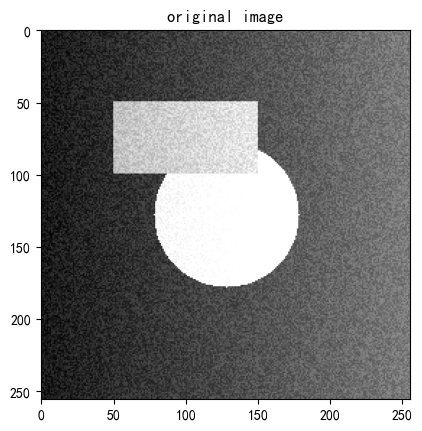

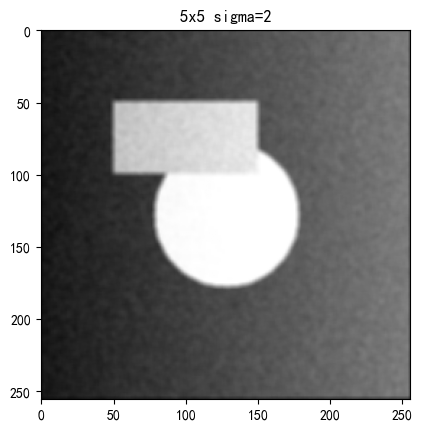

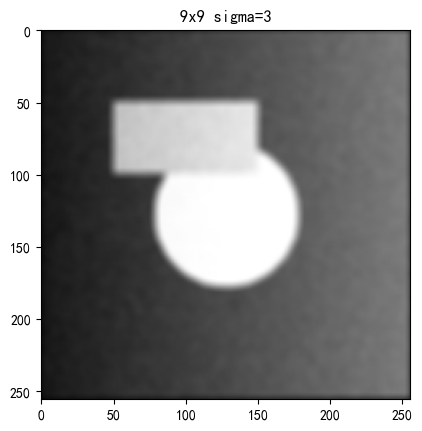

In [19]:
#高斯滤波实现--基于卷积操作
img=Image.open('./images/lena256.png').convert('L')
imgar=np.array(img) #截取一个区域

#高斯核5x5
gaussk5=gaussian_kernel(5,2)
print('gaussk5x5=',gaussk5)

#高斯核9*9
gaussk9=gaussian_kernel(9,3)
print('gaussk9x9=',gaussk9)

#通过卷积实现高斯滤波
gauimgar5=conv2d(imgar,gaussk5)
gauimgar9=conv2d(imgar,gaussk9)

#显示高斯卷积图像
plt.title('original image')
plt.imshow(imgar,cmap='gray',vmin=0,vmax=255)
plt.show()

plt.title('5x5 sigma=2')
plt.imshow(gauimgar5,cmap='gray',vmin=0,vmax=255)
plt.show()

plt.title('9x9 sigma=3')
plt.imshow(gauimgar9,cmap='gray',vmin=0,vmax=255)
plt.show()

## 5.中值滤波

In [20]:
#定义中值滤波函数
def median(ar,kernel_sizes=3):
    #中值滤波
    nb=make_neibor(ar,kernel_sizes=kernel_sizes)
    return np.median(nb,axis=2)

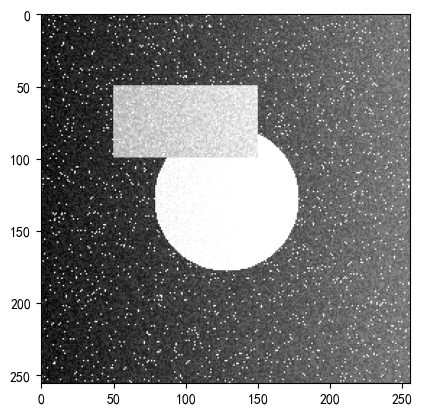

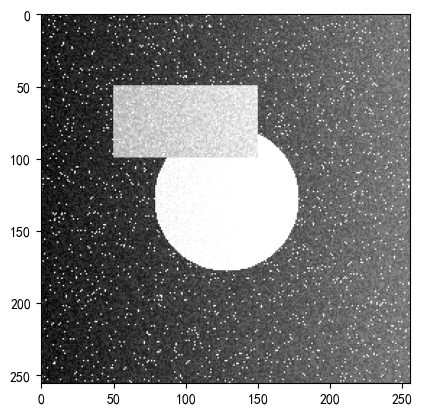

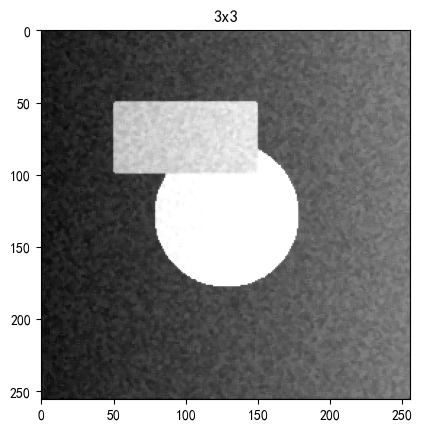

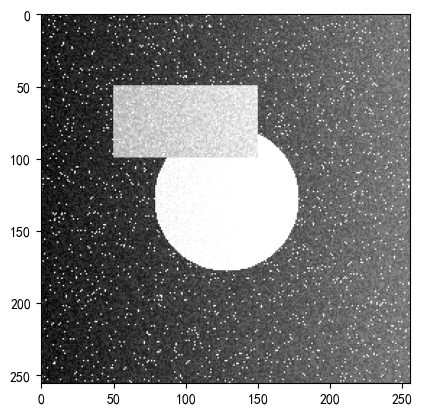

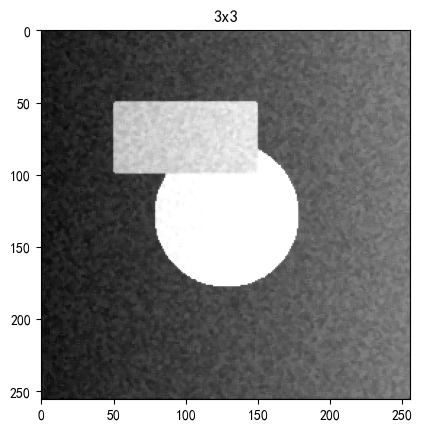

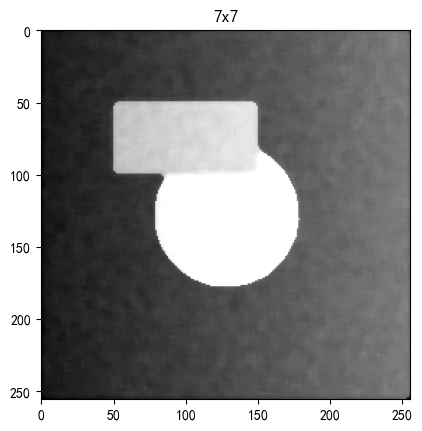

In [21]:
#实现图像的中值滤波
img=Image.open('./images/lena256.png').convert('L')
imgar=np.array(img)

#生成3%的椒盐噪声，并添加到原图像上
pepernoise=np.random.random(imgar.shape)>0.97 
nimgar=imgar.copy()
nimgar[pepernoise]=255 #将噪声加入图像
plt.imshow(nimgar,cmap='gray',vmax=255,vmin=0)#噪声图像显示
plt.show()

#使用邻域大小为3的中值滤波
medianimg=median(nimgar,kernel_sizes=3)
plt.title('3x3')
plt.imshow(medianimg,cmap='gray',vmax=255,vmin=0)#中值滤波后图像显示
plt.show()
#使用邻域大小为7的中值滤波
plt.title('7x7')
medianimg=median(nimgar,kernel_sizes=7)
plt.imshow(medianimg,cmap='gray',vmax=255,vmin=0)
plt.show()

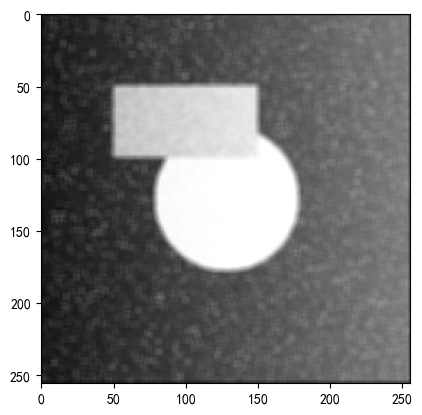

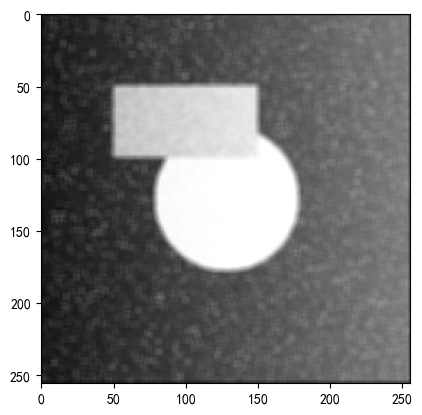

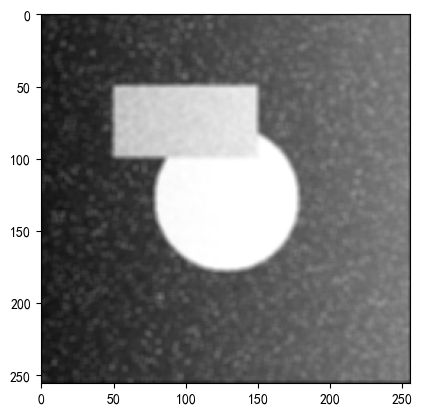

In [22]:
#对比均值滤波和高斯滤波对椒盐噪声的滤除效果
#均值滤波对椒盐噪声的滤除效果
mimgar=mean(nimgar,size=5)
plt.imshow(mimgar,cmap='gray',vmax=255,vmin=0)
plt.show() #均值滤波，相较于中值滤波对椒盐噪声的去除效果较差
#高斯滤波对椒盐噪声的滤除效果
gaussk3=gaussian_kernel(5,2)
gauimgar3=conv2d(nimgar,gaussk3)
plt.imshow(gauimgar3,cmap='gray',vmax=255,vmin=0)
plt.show()

## 6.Sobel算子

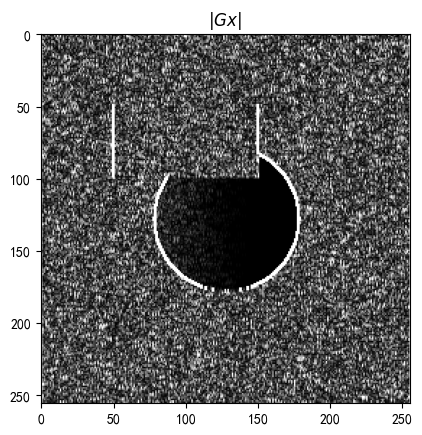

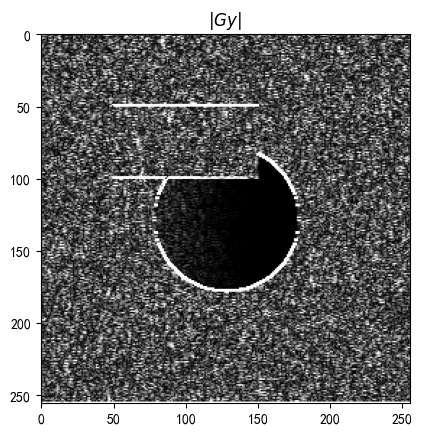

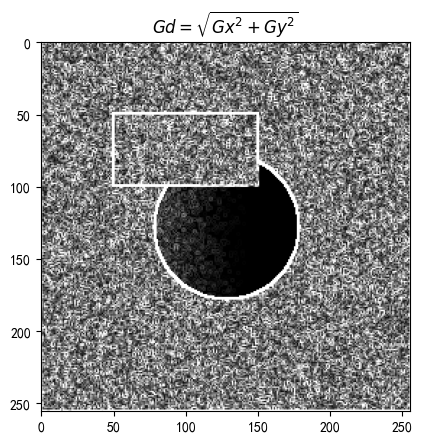

In [39]:
#sobel算子进行边缘检测
img=Image.open('./images/lena256.png').convert('L')
imgar=np.array(img)#截取一个区域
#sobel算子模板
sobelx_k=np.array([
    [-1,0,1],
    [-2,0,2],
    [-1,0,1],
])
sobely_k=np.array([
    [-1,-2,-1],
    [0,0,0],
    [1,2,1],
])
#使用Sobel算子卷积计算水平和竖直梯度
gx=conv2d(imgar,sobelx_k)
gy=conv2d(imgar,sobely_k)
#计算水平和竖直方向梯度幅值
agx=np.abs(gx)
agy=np.abs(gy)
#计算梯度幅值
gd=(gx**2+gy**2)**0.5
#显示图像梯度，即边缘检测效果
#边缘检测效果显示
plt.imshow(agx,cmap='gray',vmax=128,vmin=0)#水平方向边缘检测效果
plt.title('$|Gx|$')
plt.show()
##############
plt.imshow(agy,cmap='gray',vmax=128,vmin=0)#水平方向边缘检测效果
plt.title('$|Gy|$')
plt.show()
#################
plt.imshow(gd,cmap='gray',vmax=128,vmin=0)
plt.title('$Gd=\sqrt{Gx^2+Gy^2}$')
plt.show()

## 7.Scharr算子

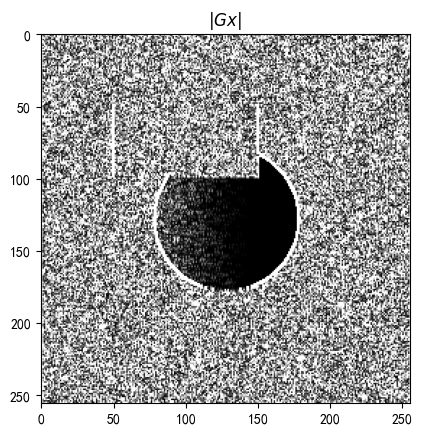

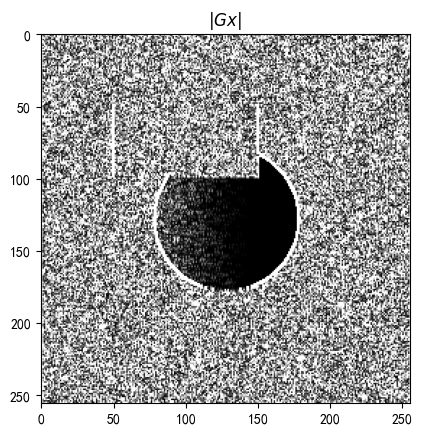

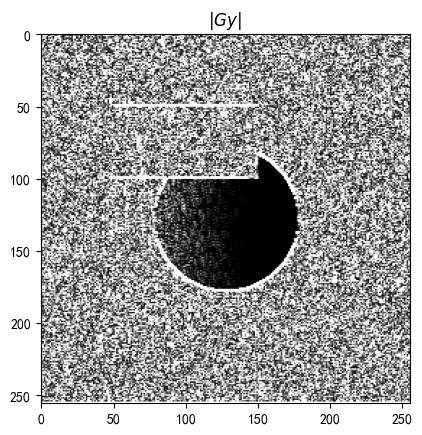

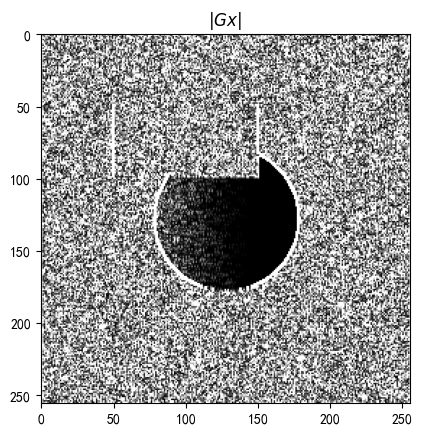

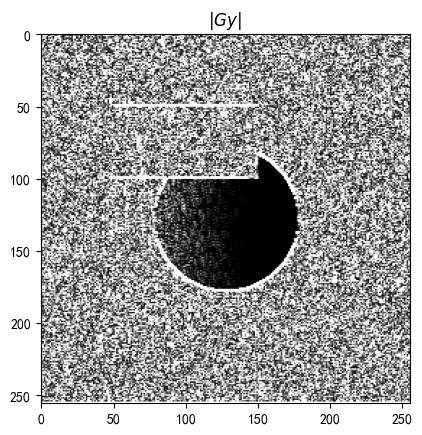

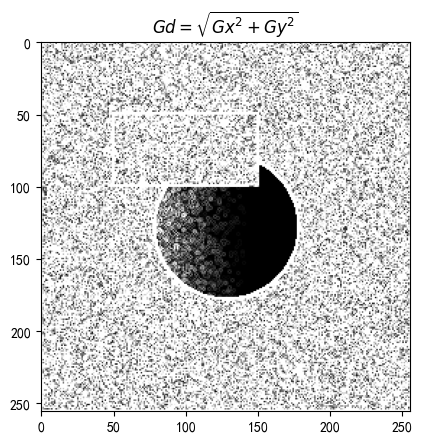

In [24]:
#Scharr算子边缘检测
img=Image.open('./images/lena256.png').convert('L')
imgar=np.array(img) 
#######Scharr算子模板
scharrx_k=np.array([
    [-3,0,3],
    [-10,0,10],
    [-3,0,3],
])
scharry_k=np.array([
    [-3,-10,-3],
    [0,0,0],
    [3,10,3],
])
#使用Scharr算子卷积计算水平和竖直梯度
gx=conv2d(imgar,scharrx_k)
gy=conv2d(imgar,scharry_k)
#计算水平和竖直方向梯度幅值
agx=np.abs(gx)
agy=np.abs(gy)
#计算梯度幅值
gd=(gx**2+gy**2)**0.5
#显示图像梯度，即边缘检测效果
#水平方向检测效果
plt.imshow(agx,cmap='gray',vmax=255,vmin=0)
plt.title('$|Gx|$')
plt.show()
#垂直方向检测效果
plt.imshow(agy,cmap='gray',vmax=255,vmin=0)
plt.title('$|Gy|$')
plt.show()
##整体边缘检测效果
plt.imshow(gd,cmap='gray',vmax=255,vmin=0)
plt.title('$Gd=\sqrt{Gx^2+Gy^2}$')
plt.show()

# 8.Prewitt算子

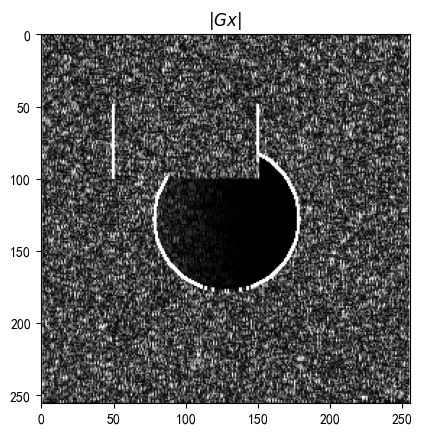

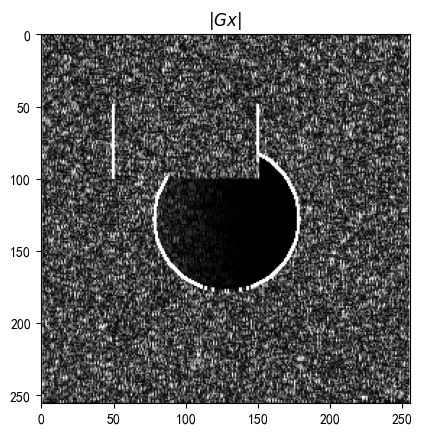

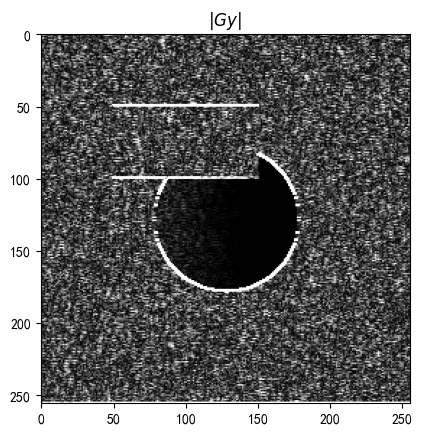

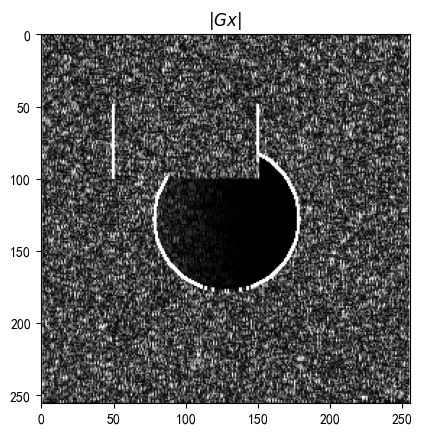

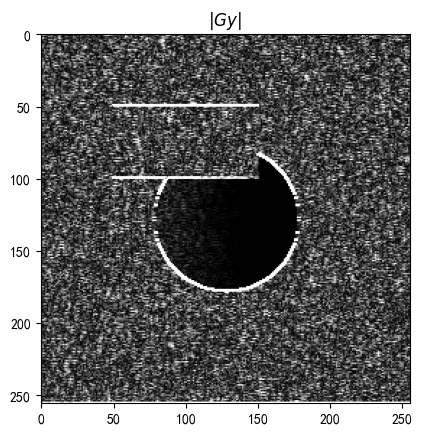

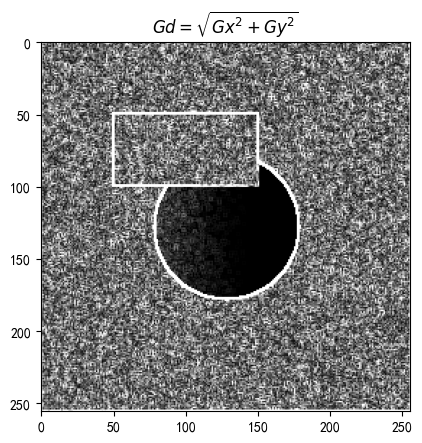

In [25]:
#Prewitt算子进行边缘检测
img=Image.open('./images/lena256.png').convert('L')
imgar=np.array(img)
#######Scharr算子
prewwitx_k=np.array([
    [-1,0,1],
    [-1,0,1],
    [-1,0,1],
])
prewwity_k=np.array([
    [-1,-1,-1],
    [0,0,0],
    [1,1,1],
])
#使用SPrewitt算子卷积计算水平和竖直梯度
gx=conv2d(imgar,prewwitx_k)
gy=conv2d(imgar,prewwity_k)
#计算水平和竖直方向梯度幅值
agx=np.abs(gx)
agy=np.abs(gy)
#计算梯度幅值
gd=(gx**2+gy**2)**0.5
#显示图像梯度，即边缘检测效果
#显示在水平方向的图像梯度
plt.imshow(agx,cmap='gray',vmax=100,vmin=0)
plt.title('$|Gx|$')
plt.show()
#显示在竖直方向的图像梯度
plt.imshow(agy,cmap='gray',vmax=100,vmin=0)
plt.title('$|Gy|$')
plt.show()
#图像梯度
plt.imshow(gd,cmap='gray',vmax=100,vmin=0)
plt.title('$Gd=\sqrt{Gx^2+Gy^2}$')
plt.show()

## 9. Laplacian算子

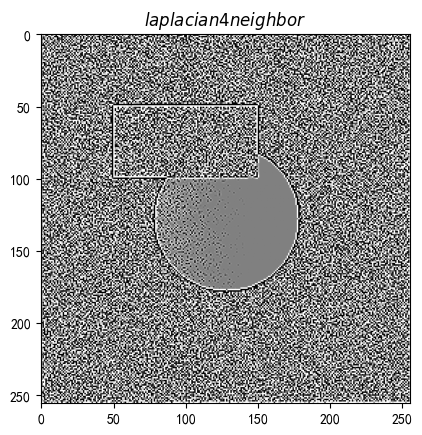

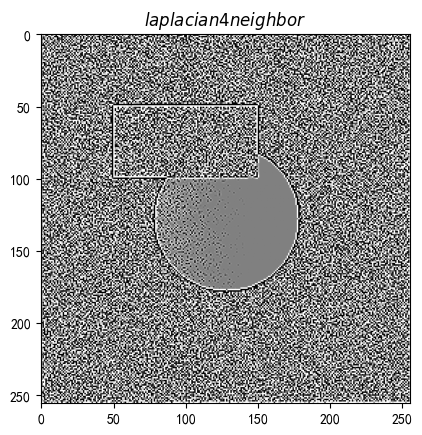

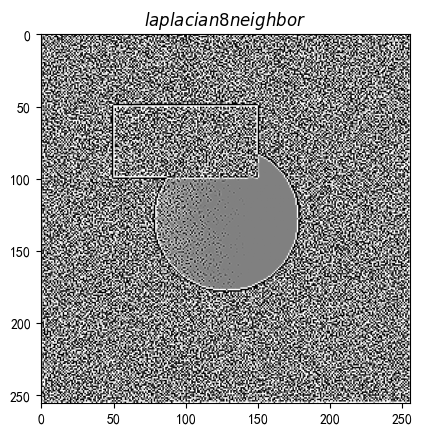

In [26]:
#Laplacian算子边缘检测
img=Image.open('./images/lena256.png').convert('L')
imgar=np.array(img)
##laplacian算子模板
la4=np.array([
    [0,-1,0],
    [-1,4,-1],
    [0,-1,0],
])
la8=np.array([
    [-1,-1,-1],
    [-1,8,-1],
    [-1,-1,-1],
])
#算子作用到图像
gla4=conv2d(imgar,la4)
gla8=conv2d(imgar,la8)

#边缘检测效果展示
plt.imshow(gla4,cmap='gray',vmin=-40,vmax=40)
plt.title('$laplacian 4 neighbor$')
plt.show()
plt.imshow(gla4,cmap='gray',vmin=-40,vmax=40)
plt.title('$laplacian 8 neighbor$')
plt.show()

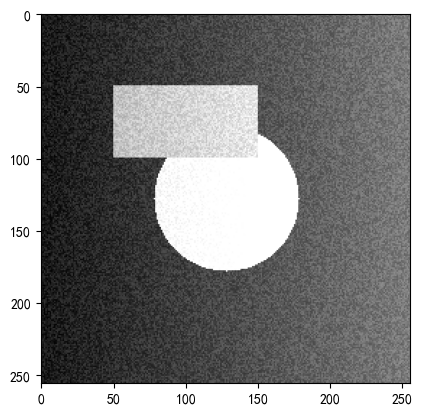

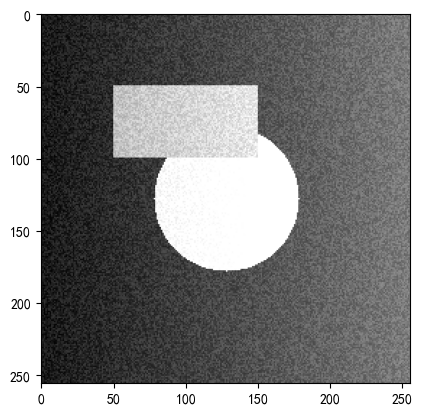

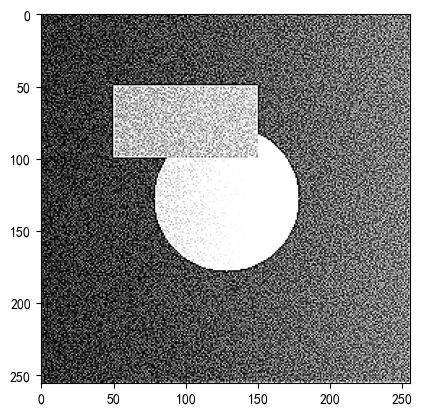

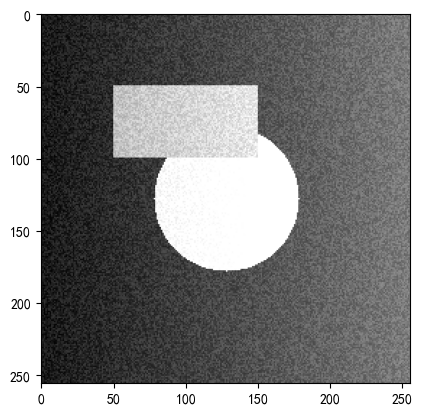

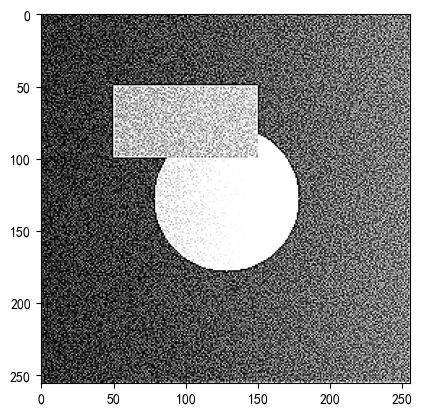

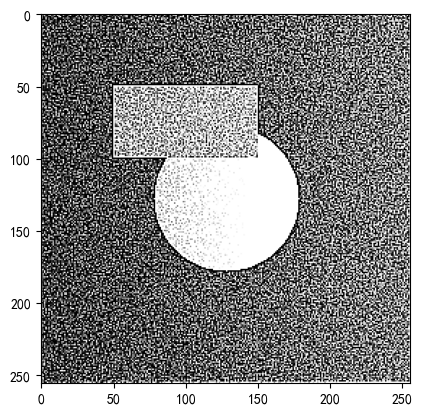

In [27]:
#使用图像边缘增强的Laplacian增强算子进行边缘的增强
img=Image.open('./images/lena256.png').convert('L')
imgar=np.array(img)
##laplacian算子模板
la4=np.array([
    [0,-1,0],
    [-1,5,-1],
    [0,-1,0],
])
la8=np.array([
    [-1,-1,-1],
    [-1,9,-1],
    [-1,-1,-1],
])
#算子作用到图像
gla4=conv2d(imgar,la4)
gla8=conv2d(imgar,la8)
#图像显示
plt.imshow(imgar,cmap='gray',vmin=0,vmax=255)
plt.show()
plt.imshow(gla4,cmap='gray',vmin=0,vmax=255)
plt.show()
plt.imshow(gla8,cmap='gray',vmin=0,vmax=255)
plt.show()

# 10. 形态学运算

## 10.1 膨胀和腐蚀

In [28]:
#实现膨胀和腐蚀运算
#膨胀运算
def dilate(imgar,pattern=None):
    pattern=np.ones((3,3))  if pattern is None else pattern
    nb=make_neibor(imgar,pattern=pattern)
    return  nb.any(axis=2) if imgar.dtype==bool else nb.max(axis=2) 
#腐蚀运算
def erosion(imgar,pattern=None):
    pattern=np.ones((3,3))  if pattern is None else pattern
    nb=make_neibor(imgar,pattern=pattern)
    return  nb.all(axis=2) if imgar.dtype==bool else nb.min(axis=2) 

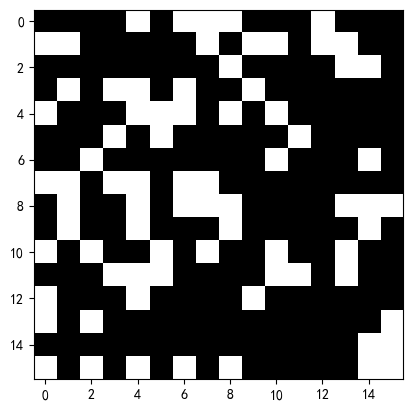

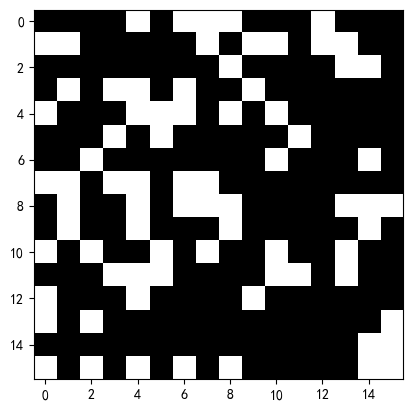

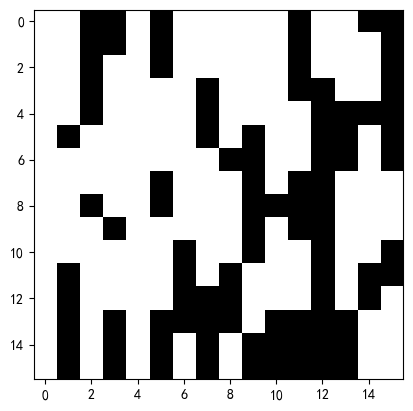

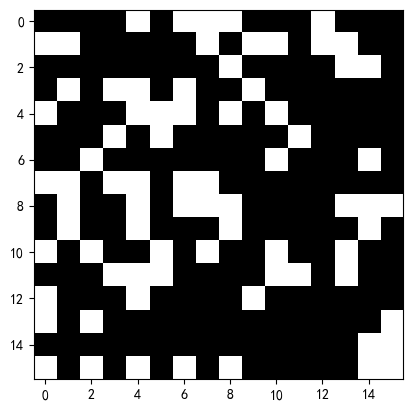

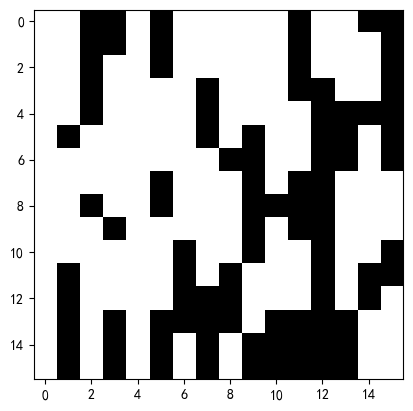

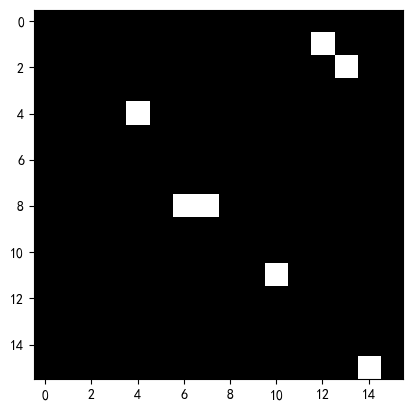

In [29]:
#二值图像膨胀运算
#生成一幅二值图像
bar=np.random.random((16,16))>0.65
plt.imshow(bar,cmap='gray',vmax=1,vmin=0)
plt.show()
# 膨胀运算结构元素
pt=np.array([
    [0,1,0],
    [0,1,0],
    [0,1,0]
])
#膨胀运算
dar=dilate(bar,pattern=pt)
plt.imshow(dar,cmap='gray',vmax=1,vmin=0)
plt.show()
#腐蚀运算结构元素
pt=np.array([
    [0,1,0],
    [0,1,1],
    [0,0,0]
])
#腐蚀运算
ear=erosion(bar,pattern=pt)
plt.imshow(ear,cmap='gray',vmax=1,vmin=0)
plt.show()

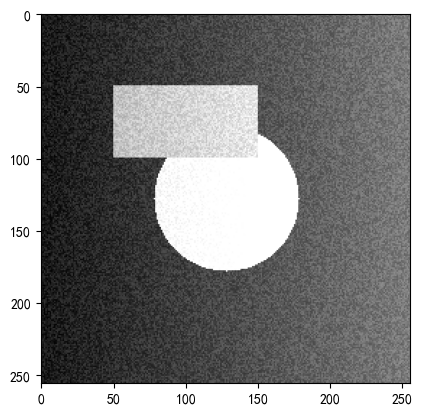

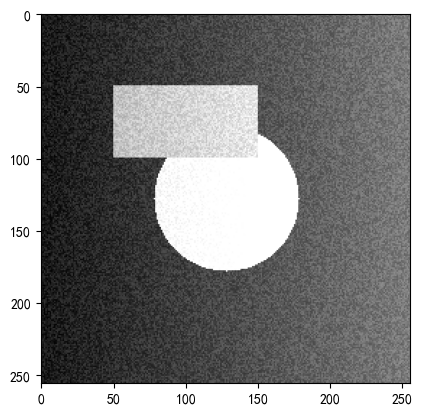

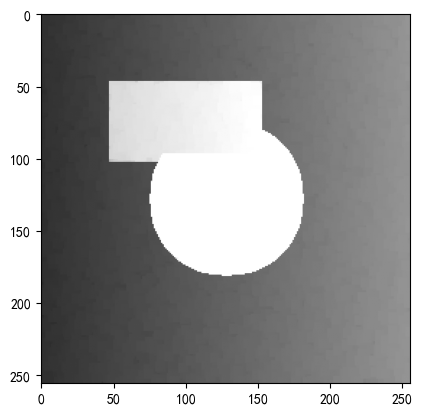

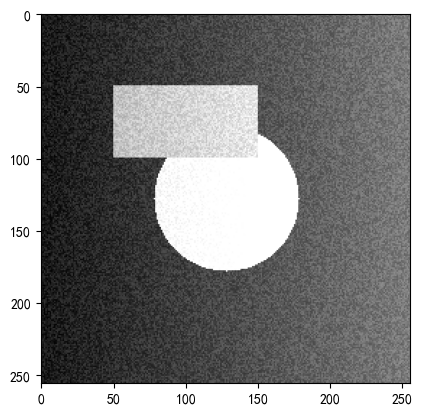

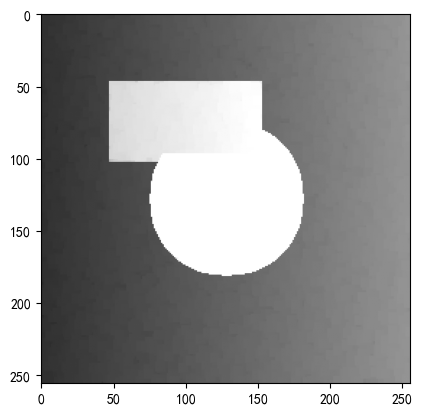

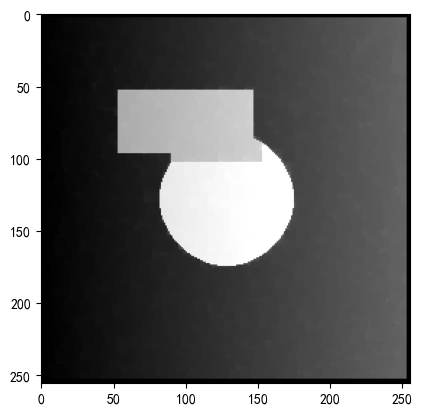

In [30]:
#灰度图像的膨胀和腐蚀运算
img=Image.open('./images/lena256.png')
imgar=np.array(img.convert('L'))
plt.imshow(imgar,cmap='gray',vmax=255,vmin=0)
plt.show()
###灰度图像膨胀
pt=np.ones((7,7))  #结构元素为17x17的矩形
dimg=dilate(imgar,pt)
plt.imshow(dimg,cmap='gray',vmax=255,vmin=0)
plt.show()
#灰度图像腐蚀
dimg=erosion(imgar,pt) #进行一次17x17的膨胀运算
plt.imshow(dimg,cmap='gray',vmax=255,vmin=0)
plt.show()

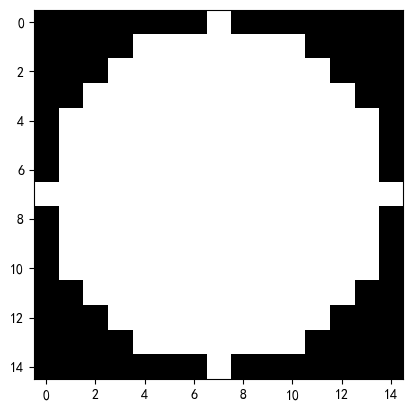

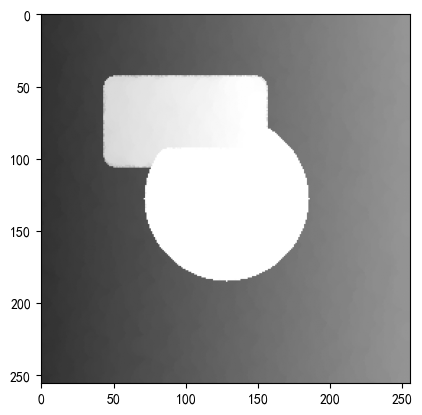

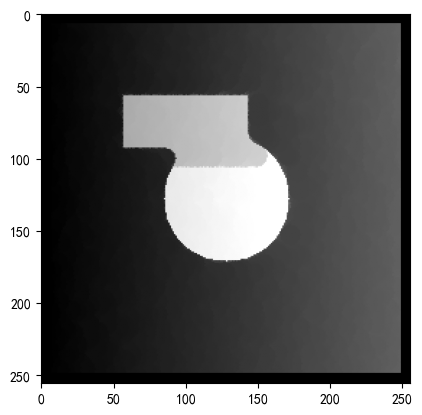

In [48]:
#圆形结构元素进行膨胀和腐蚀
#生成一个圆形的结构元素
y,x=np.mgrid[-7:7:15j,-7:7:15j]
pt=(x**2+y**2)<50
plt.imshow(pt,cmap='gray',vmax=1,vmin=0)
plt.show()
##使用上述结构元素对图像进膨胀
dimg=dilate(imgar,pt)
plt.imshow(dimg,cmap='gray',vmax=255,vmin=0)
plt.show()
##使用上述结构元素对图像进腐蚀
eimg=erosion(imgar,pt)
plt.imshow(eimg,cmap='gray',vmax=255,vmin=0)
plt.show()

## 10.2 基本梯度

In [31]:
#图像形态学基本梯度函数
def mgradient(ar,pattern=None):
    #形态学梯度膨胀-腐蚀
    pattern=np.ones((3,3))  if pattern is None else pattern
    dar=dilate(ar,pattern)
    ear=erosion(ar,pattern)
    return dar^ear  if dar.dtype==bool  else  dar-ear

0 225


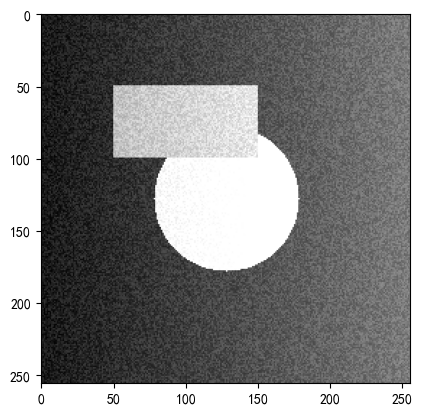

0 225


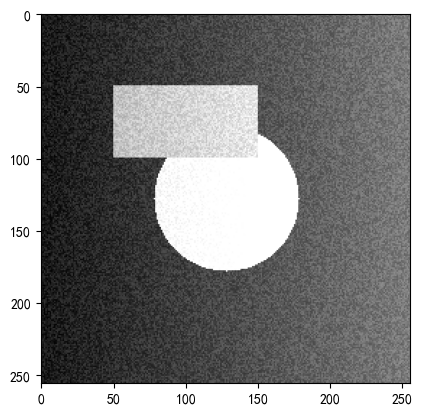

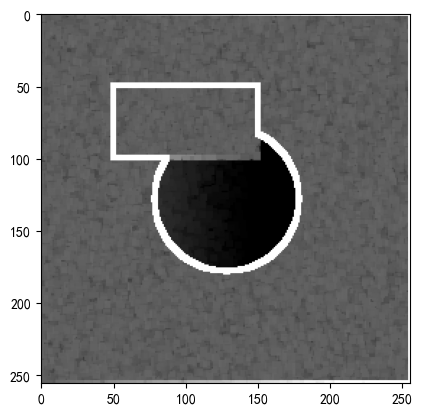

In [32]:
#灰度图像的形态学基本梯度
img=Image.open('./images/lena256.png')
imgar=np.array(img.convert('L'))
pt=np.ones((5,5))
mgimg=mgradient(imgar,pt)
print(mgimg.min(),mgimg.max())
plt.imshow(imgar,cmap='gray',vmax=255,vmin=0)
plt.show()
plt.imshow(mgimg,cmap='gray',vmax=127,vmin=0)
plt.show()

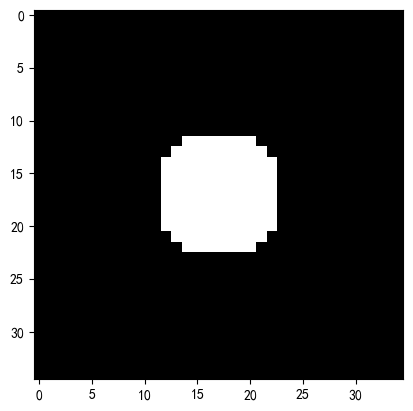

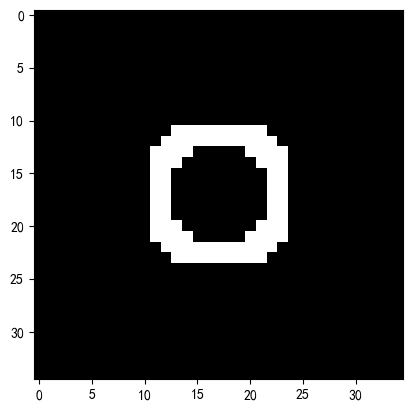

In [49]:
###二值图像的形态学基本梯度
y,x=np.mgrid[-17:17:35j,-17:17:35j]
bar=(x**2+y**2)<36
plt.imshow(bar,cmap='gray',vmax=1,vmin=0)
plt.show()
mgar=mgradient(bar)
plt.imshow(mgar,cmap='gray',vmax=1,vmin=0)
plt.show()

## 10.3 开运算与闭运算

In [41]:
#定义形态学开运算和闭运算
#开运算
def mopen(ar,pattern=None):
    pattern=np.ones((3,3))  if pattern is None else pattern
    ear=erosion(ar,pattern)
    return dilate(ear,pattern)
#闭运算
def mclose(ar,pattern=None):
    pattern=np.ones((3,3))  if pattern is None else pattern
    dar=dilate(ar,pattern)
    return erosion(dar,pattern)

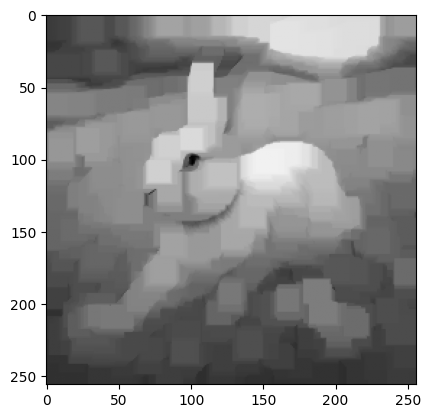

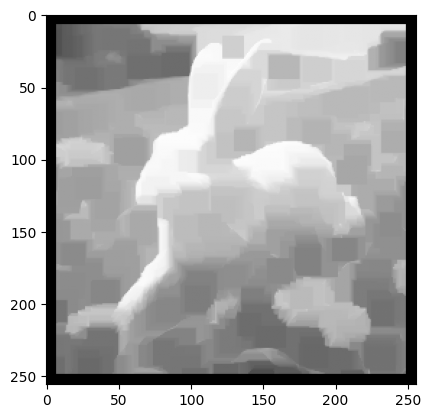

In [60]:
#灰度图像开、闭运算处理
img=Image.open('./images/lena256.png')
imgar=np.array(img.convert('L'))
#灰度图像开运算
pt=np.ones((15,15))
mgimg=mopen(imgar,pt)
plt.imshow(mgimg,cmap='gray',vmax=255,vmin=0)
plt.show()
#灰度图像闭运算处理
pt=np.ones((15,15))
mgimg=mclose(imgar,pt)
plt.imshow(mgimg,cmap='gray',vmax=255,vmin=0)
plt.show()

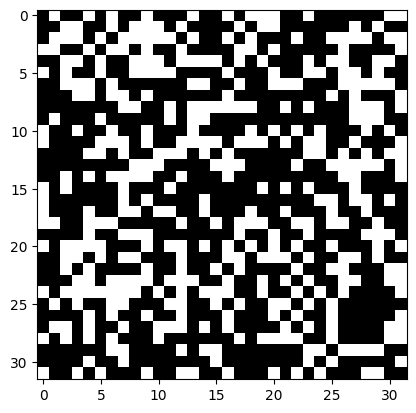

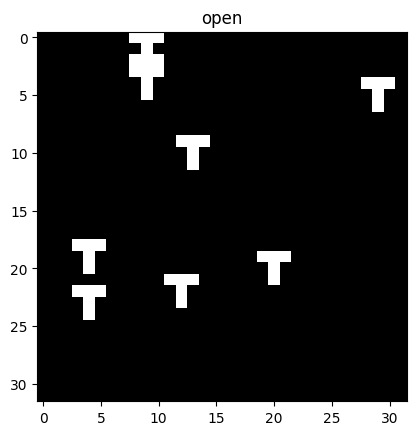

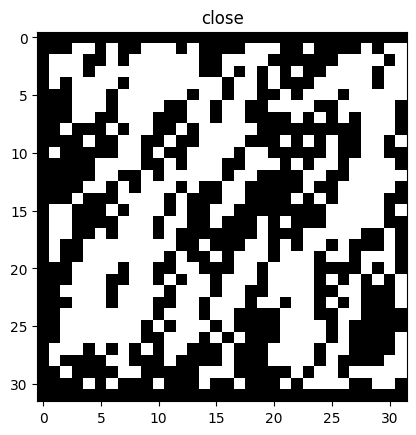

In [61]:
##二值图像开运算和闭运算操作
#生成二值图像
bar=np.random.random((32,32))>0.6
plt.imshow(bar,cmap='gray',vmax=1,vmin=0)
plt.show()
#二值图像开运算
pt=np.array([
    [0,1,0],
    [0,1,0],
    [1,1,1]
])
oar=mopen(bar,pt)
plt.imshow(oar,cmap='gray',vmax=1,vmin=0)
plt.title('open')
plt.show()
#二值图像闭运算
pt=np.array([
    [0,1,0],
    [0,1,0],
    [1,0,0]
])
car=mclose(bar,pt)
plt.imshow(car,cmap='gray',vmax=1,vmin=0)
plt.title('close')
plt.show()

## 10.4 顶帽运算和黑帽运算

In [42]:
#定义顶帽运算和黑帽运算
#顶帽运算
def tophat(ar,pattern=None):
    pattern=np.ones((3,3))  if pattern is None else pattern
    ear=erosion(ar,pattern)
    return ar^ear   if ar.dtype==bool else ar-ear   
#黑帽运算
def blackhat(ar,pattern=None):
    pattern=np.ones((3,3))  if pattern is None else pattern
    dar=dilate(ar,pattern)
    return ar^dar   if ar.dtype==bool else dar-ar   

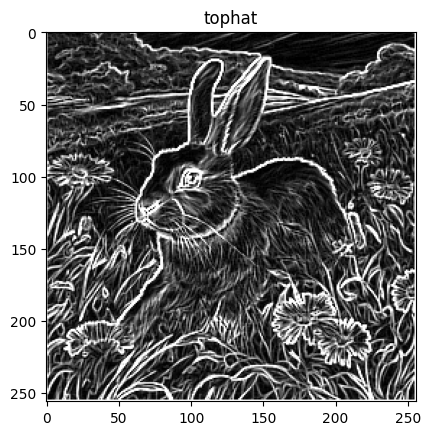

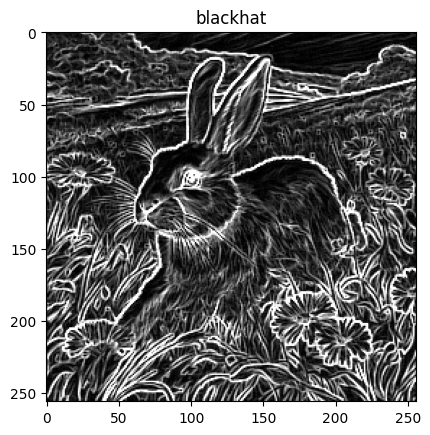

In [63]:
#灰度图像的顶帽运算和黑帽运算
img=Image.open('./images/lena256.png')
imgar=np.array(img.convert('L'))
#顶帽运算
tar=tophat(imgar)
plt.imshow(tar,cmap='gray',vmax=38,vmin=0)
plt.title('tophat')
plt.show()
#黑帽运算
bar=blackhat(imgar)
plt.imshow(bar,cmap='gray',vmax=38,vmin=0)
plt.title('blackhat')
plt.show()

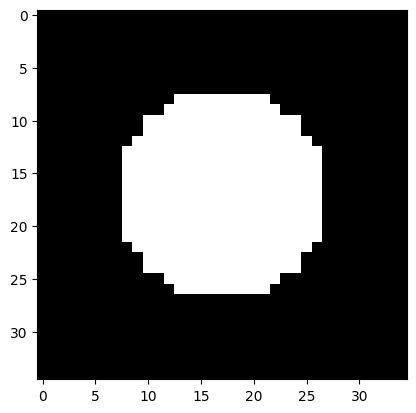

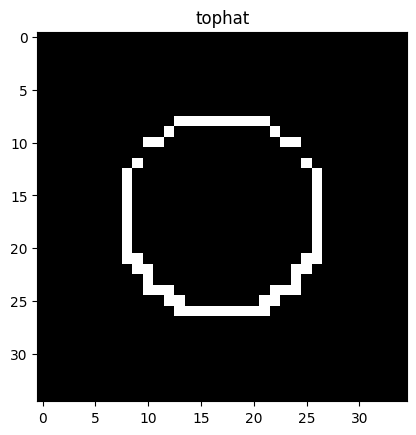

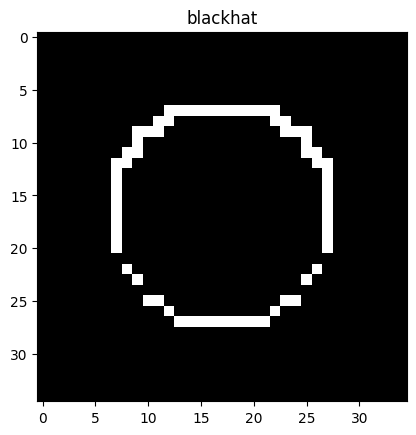

In [64]:
##二值图像顶帽运算和黑帽运算操作
#生成二值图像
y,x=np.mgrid[-17:17:35j,-17:17:35j]
bar=(x**2+y**2)<100
plt.imshow(bar,cmap='gray',vmax=1,vmin=0)
plt.show()
#二值图像顶帽运算
pt=np.array([
    [0,1,0],
    [0,1,0],
    [1,1,1]
])
oar=tophat(bar,pt)
plt.imshow(oar,cmap='gray',vmax=1,vmin=0)
plt.title('tophat')
plt.show()
#二值图像黑帽运算
car=blackhat(bar,pt)
plt.imshow(car,cmap='gray',vmax=1,vmin=0)
plt.title('blackhat')
plt.show()

## 10.5 击中-击不中变换

击中—击不中变换
在击中—击不中变换里，结构元素中包含3个值，0,1和-1。

0表示不关心此处的值；

1表示此处的值要击中，就是要包含；

-1表示此处的值不能击中，就是不能被包含。

击中—击不变换用于二值图像时有明确的含义，也可用于灰度图像。

In [43]:
def hitmiss(bar,pattern=None):
    p=np.array([[-1,1,-1],
                [1,1,1],
                [-1,1,-1]
            ])
    pattern=p  if pattern is None else pattern
    b1=pattern>0
    b2=pattern<0
    r1=erosion(bar,b1)
    cbar=~bar if bar.dtype==bool else 255-bar
    r2=erosion(cbar,b2) 
    r=np.dstack([r1,r2])
    print(r.shape)
    return r.min(axis=2)

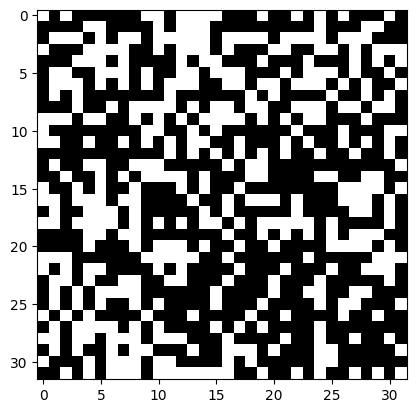

In [66]:
#生成一个二值图像
bar=np.random.random((32,32))>0.6
plt.imshow(bar,cmap='gray',vmax=1,vmin=0)
plt.show()

(35, 35, 2)


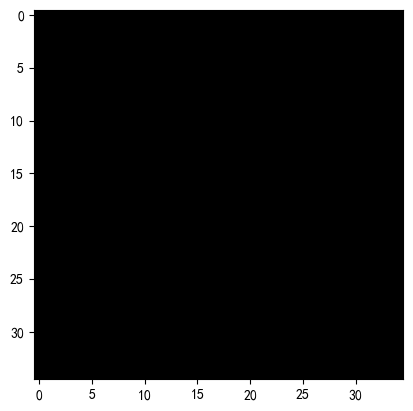

In [50]:
#使用结构化元素对上述二值图像进行击中—击不中变换
se=np.array([[-1,1,-1],
            [1,1,1],
            [0,0,0]
            ])
har=hitmiss(bar,se)
plt.imshow(har,cmap='gray',vmax=1,vmin=0)
plt.show()

(256, 256, 2)
134 0


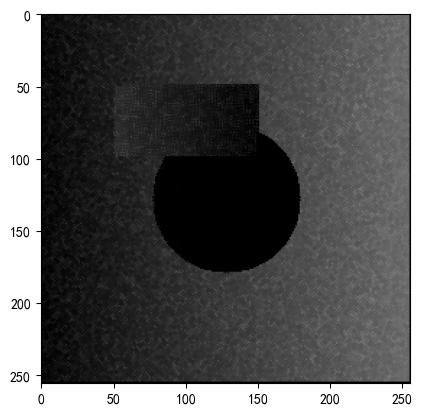

(400, 600, 2)

In [51]:
#对灰度图像进行击中—击不中变换
se=np.array([[-1,1,-1],
            [1,0,1],
            [-1,1,-1]
            ])
har=hitmiss(imgar,se)
print(har.max(),har.min())
plt.imshow(har,cmap='gray',vmax=255,vmin=0)
plt.show()
(400, 600, 2)

## 11.找不同

利用邻域运算中的形态学运算可以较好的去除找不同二值化后的噪声。

In [52]:
imgar2=np.array(Image.open('./images/1.webp').convert('L'))
#将图像分成左右两部分
floatimg=imgar2.astype(np.float32)
plt.imshow(floatimg,cmap='gray',vmin=0,vmax=255)
plt.show()
leftimg=floatimg[:,:500]
rightimg=floatimg[:,500:]
plt.imshow(leftimg,cmap='gray',vmin=0,vmax=255)
plt.show() 
plt.imshow(rightimg,cmap='gray',vmin=0,vmax=255)
plt.show()  

FileNotFoundError: [Errno 2] No such file or directory: './images/1.webp'

In [53]:
#图像求差
res=leftimg-rightimg
#求取绝对值
res1=np.abs(res)
#利用二值化方法得到不同的区域
res2=np.where(res1>(res1.mean()+3*res1.std()),255,0)
plt.imshow(res2,cmap='gray',vmin=0,vmax=255)  
plt.show()   
#以下结果中有许多微小的白色噪声

NameError: name 'leftimg' is not defined

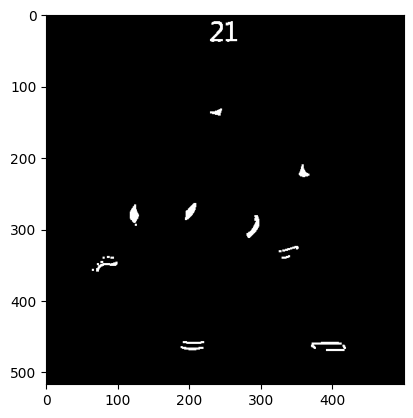

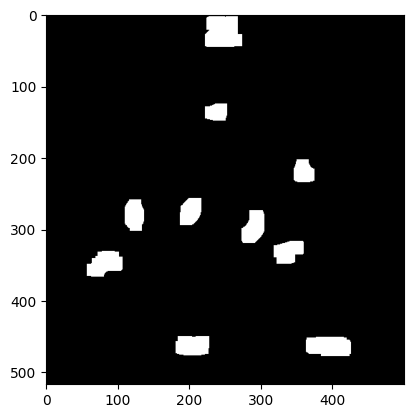

In [96]:
#使用形态学的开运算
pt=np.ones((3,3))
res3=mopen(res2,pt)
plt.imshow(res3,cmap='gray',vmin=0,vmax=255) 
plt.show()   
#使用膨胀让区域变得大一些
pt2=np.ones((15,15))
res4=dilate(res3,pt2)
plt.imshow(res4,cmap='gray',vmin=0,vmax=255) 
plt.show() 

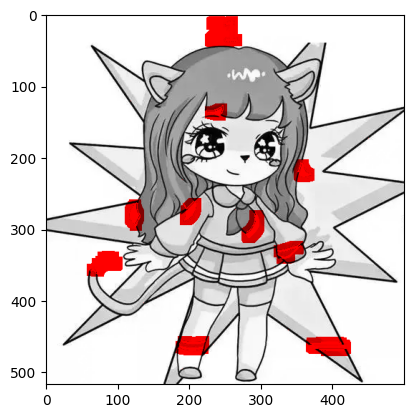

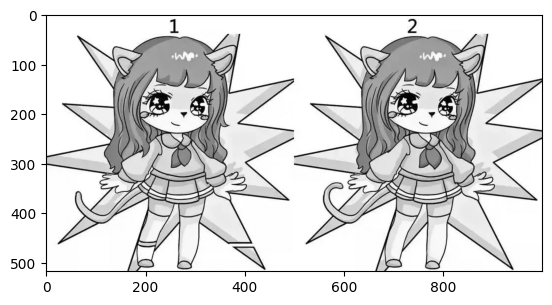

In [97]:
#将检测结果作为红通道与原图像合并 ,注意连续使用
redband=res2+leftimg
blueband=greenband=leftimg-res4
l=np.dstack([redband,blueband,greenband])
l=np.clip(l,0,255).astype(np.uint8)
plt.imshow(l,cmap='gray',vmin=0,vmax=255)
plt.show()
plt.imshow(imgar2,cmap='gray',vmin=0,vmax=255)
plt.show()

# 实验报告：图像的邻域运算

## 实验目的
通过实现和验证各种图像邻域运算方法，包括卷积运算、滤波算法、边缘检测算子和形态学运算，深入理解数字图像处理中的邻域运算原理。

## 实验环境
- Python 3.x
- NumPy (数组运算)
- Matplotlib (图像显示和可视化)
- PIL (图像读取)
- PyDICOM (医学图像处理)

---

## 1. 邻域的生成

### 实验目的
验证邻域生成方法的正确性，理解邻域展开在图像处理中的作用。

### 实验步骤

In [47]:
# 验证邻域生成方法的正确性
print("=== 1. 邻域生成验证实验 ===")
print()

# 创建一个简单的3x3测试图像
test_img = np.array([[1, 2, 3],
                     [4, 5, 6], 
                     [7, 8, 9]])

print("原始图像:")
print(test_img)
print()

# 使用3x3邻域生成
nbar = make_neibor_simple(test_img, kernel_size=3)
print(f"邻域展开后的尺寸: {nbar.shape}")
print(f"原图尺寸: {test_img.shape}, 邻域展开后的通道数: {nbar.shape[2]}")
print()

# 验证中心像素(1,1)的邻域
print("中心像素(1,1)的3x3邻域:")
print(nbar[1,1])
print("理论值应该是: [1,2,3,4,5,6,7,8,9] (从左上到右下)")
print()

# 验证边界像素(0,0)的邻域 (应该有填充效果)
print("边界像素(0,0)的3x3邻域 (包含填充):")
print(nbar[0,0])
print("注意边界填充效果")
print()

# 使用改进的邻域生成函数测试不同形状
print("=== 测试不同形状的邻域 ===")

# 十字形邻域
cross_pattern = np.array([[0,1,0],
                         [1,1,1],
                         [0,1,0]])

nbar_cross = make_neibor(test_img, pattern=cross_pattern)
print(f"十字形邻域展开尺寸: {nbar_cross.shape}")
print(f"十字形邻域通道数: {nbar_cross.shape[2]} (应该是5)")
print("中心像素(1,1)的十字形邻域:")
print(nbar_cross[1,1])
print()

=== 1. 邻域生成验证实验 ===

原始图像:
[[1 2 3]
 [4 5 6]
 [7 8 9]]

邻域展开后的尺寸: (3, 3, 9)
原图尺寸: (3, 3), 邻域展开后的通道数: 9

中心像素(1,1)的3x3邻域:
[1 2 3 4 5 6 7 8 9]
理论值应该是: [1,2,3,4,5,6,7,8,9] (从左上到右下)

边界像素(0,0)的3x3邻域 (包含填充):
[0 0 0 0 1 2 0 4 5]
注意边界填充效果

=== 测试不同形状的邻域 ===
十字形邻域展开尺寸: (3, 3, 5)
十字形邻域通道数: 5 (应该是5)
中心像素(1,1)的十字形邻域:
[2 4 5 6 8]



### 实验结果分析
1. **邻域展开验证成功**: 3×3图像经过3×3邻域展开后，尺寸保持不变(3,3)，但增加了9个通道
2. **边界填充效果**: 边界像素的邻域包含填充值0，验证了边界处理的正确性
3. **形状邻域支持**: 十字形邻域正确生成5个通道，验证了自定义形状邻域的功能

---

## 2. 卷积运算

### 实验目的
验证卷积运算的正确性，并通过均值滤波和高斯滤波验证卷积的应用。

### 实验步骤

In [54]:
# 卷积运算验证
print("=== 2. 卷积运算验证实验 ===")
print()

# 使用相同的测试图像
test_img = np.array([[1, 2, 3],
                     [4, 5, 6], 
                     [7, 8, 9]])

print("原始图像:")
print(test_img)
print()

# 验证1: 全1卷积核 (相当于邻域求和)
kernel_ones = np.ones((3,3))
print("3×3全1卷积核:")
print(kernel_ones)

conv_result = conv2d(test_img, kernel_ones)
print("卷积结果:")
print(conv_result)
print("中心像素(1,1)的卷积值:", conv_result[1,1], "(应该是45)")
print()

# 验证2: 单位卷积核 (应该返回原图像)
kernel_identity = np.array([[0,0,0],
                           [0,1,0],
                           [0,0,0]])
print("单位卷积核:")
print(kernel_identity)

conv_identity = conv2d(test_img, kernel_identity)
print("单位卷积结果:")
print(conv_identity)
print("结果应该与原图像相同")
print()

# 验证3: 边缘检测卷积核
kernel_edge = np.array([[-1,-1,-1],
                       [-1, 8,-1],
                       [-1,-1,-1]])
print("边缘检测卷积核:")
print(kernel_edge)

conv_edge = conv2d(test_img, kernel_edge)
print("边缘检测卷积结果:")
print(conv_edge)
print()

=== 2. 卷积运算验证实验 ===

原始图像:
[[1 2 3]
 [4 5 6]
 [7 8 9]]

3×3全1卷积核:
[[1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]]
卷积结果:
[[12. 21. 16.]
 [27. 45. 33.]
 [24. 39. 28.]]
中心像素(1,1)的卷积值: 45.0 (应该是45)

单位卷积核:
[[0 0 0]
 [0 1 0]
 [0 0 0]]
单位卷积结果:
[[1 2 3]
 [4 5 6]
 [7 8 9]]
结果应该与原图像相同

边缘检测卷积核:
[[-1 -1 -1]
 [-1  8 -1]
 [-1 -1 -1]]
边缘检测卷积结果:
[[-3 -3 11]
 [ 9  0 21]
 [39 33 53]]



=== 3. 均值滤波实验 ===

成功载入图像，尺寸: (256, 256)


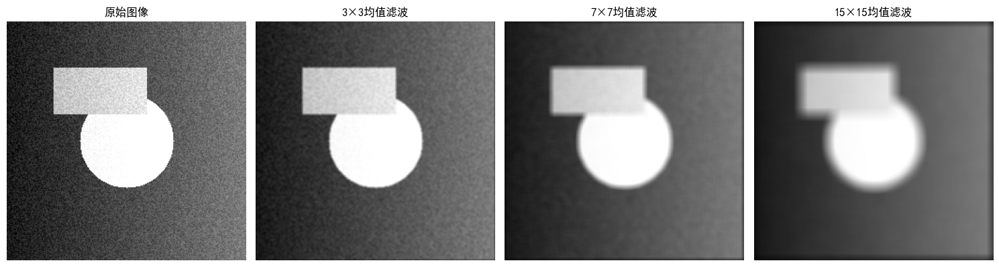

均值滤波效果观察:
- 滤波器尺寸越大，图像越模糊
- 均值滤波能有效去除噪声，但会使图像边缘模糊



In [55]:
# 均值滤波实验
print("=== 3. 均值滤波实验 ===")
print()

# 载入Lena图像进行实际测试
try:
    img = Image.open('./images/lena256.png').convert('L')
    imgar = np.array(img)
    print(f"成功载入图像，尺寸: {imgar.shape}")
    
    # 显示原始图像
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 4, 1)
    plt.imshow(imgar, cmap='gray', vmin=0, vmax=255)
    plt.title('原始图像')
    plt.axis('off')
    
    # 3x3均值滤波
    mean3 = mean(imgar, size=3)
    plt.subplot(1, 4, 2)
    plt.imshow(mean3, cmap='gray', vmin=0, vmax=255)
    plt.title('3×3均值滤波')
    plt.axis('off')
    
    # 7x7均值滤波
    mean7 = mean(imgar, size=7)
    plt.subplot(1, 4, 3)
    plt.imshow(mean7, cmap='gray', vmin=0, vmax=255)
    plt.title('7×7均值滤波')
    plt.axis('off')
    
    # 15x15均值滤波
    mean15 = mean(imgar, size=15)
    plt.subplot(1, 4, 4)
    plt.imshow(mean15, cmap='gray', vmin=0, vmax=255)
    plt.title('15×15均值滤波')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("均值滤波效果观察:")
    print("- 滤波器尺寸越大，图像越模糊")
    print("- 均值滤波能有效去除噪声，但会使图像边缘模糊")
    print()
    
except FileNotFoundError:
    print("图像文件未找到，使用随机图像进行演示")
    # 创建一个包含噪声的测试图像
    test_img_noise = np.random.randint(0, 256, (50, 50)).astype(np.uint8)
    mean_result = mean(test_img_noise, size=5)
    
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(test_img_noise, cmap='gray', vmin=0, vmax=255)
    plt.title('含噪声图像')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(mean_result, cmap='gray', vmin=0, vmax=255)
    plt.title('5×5均值滤波后')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    print("均值滤波成功去除了噪声")
    print()

=== 4. 高斯滤波实验 ===

3×3高斯核 (σ=1):
[[0.07511361 0.1238414  0.07511361]
 [0.1238414  0.20417996 0.1238414 ]
 [0.07511361 0.1238414  0.07511361]]

5×5高斯核 (σ=2):
[[0.02324684 0.03382395 0.03832756 0.03382395 0.02324684]
 [0.03382395 0.04921356 0.05576627 0.04921356 0.03382395]
 [0.03832756 0.05576627 0.06319146 0.05576627 0.03832756]
 [0.03382395 0.04921356 0.05576627 0.04921356 0.03382395]
 [0.02324684 0.03382395 0.03832756 0.03382395 0.02324684]]



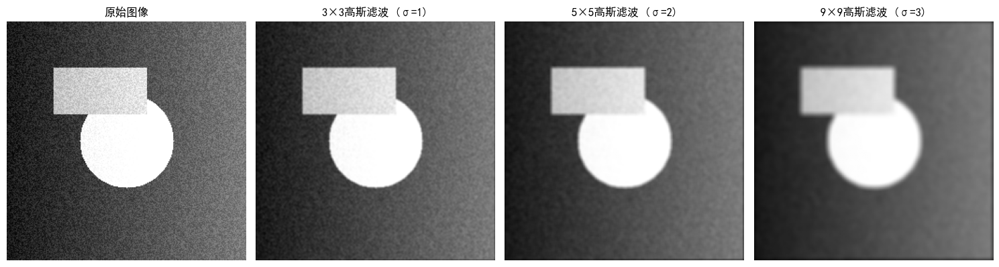

高斯滤波效果观察:
- 高斯滤波比均值滤波保持更好的边缘信息
- 标准差σ越大，模糊程度越高
- 高斯滤波在去噪的同时能较好地保持图像结构



In [56]:
# 高斯滤波实验
print("=== 4. 高斯滤波实验 ===")
print()

# 生成不同参数的高斯核
gauss3_1 = gaussian_kernel(3, 1)
gauss5_2 = gaussian_kernel(5, 2)
gauss9_3 = gaussian_kernel(9, 3)

print("3×3高斯核 (σ=1):")
print(gauss3_1)
print()

print("5×5高斯核 (σ=2):")
print(gauss5_2)
print()

# 应用高斯滤波
try:
    img = Image.open('./images/lena256.png').convert('L')
    imgar = np.array(img)
    
    # 不同参数的高斯滤波
    gauss_result3 = conv2d(imgar, gauss3_1)
    gauss_result5 = conv2d(imgar, gauss5_2)
    gauss_result9 = conv2d(imgar, gauss9_3)
    
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 4, 1)
    plt.imshow(imgar, cmap='gray', vmin=0, vmax=255)
    plt.title('原始图像')
    plt.axis('off')
    
    plt.subplot(1, 4, 2)
    plt.imshow(gauss_result3, cmap='gray', vmin=0, vmax=255)
    plt.title('3×3高斯滤波 (σ=1)')
    plt.axis('off')
    
    plt.subplot(1, 4, 3)
    plt.imshow(gauss_result5, cmap='gray', vmin=0, vmax=255)
    plt.title('5×5高斯滤波 (σ=2)')
    plt.axis('off')
    
    plt.subplot(1, 4, 4)
    plt.imshow(gauss_result9, cmap='gray', vmin=0, vmax=255)
    plt.title('9×9高斯滤波 (σ=3)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("高斯滤波效果观察:")
    print("- 高斯滤波比均值滤波保持更好的边缘信息")
    print("- 标准差σ越大，模糊程度越高")
    print("- 高斯滤波在去噪的同时能较好地保持图像结构")
    print()

except FileNotFoundError:
    print("使用随机图像进行高斯滤波演示")
    test_img = np.random.randint(0, 256, (30, 30)).astype(np.uint8)
    gauss_test = conv2d(test_img, gauss5_2)
    
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(test_img, cmap='gray')
    plt.title('原始图像')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(gauss_test, cmap='gray')
    plt.title('5×5高斯滤波')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    print()

---

## 4. 形态学运算实验

### 实验目的
验证形态学运算的基本操作：膨胀、腐蚀、开运算、闭运算、顶帽、黑帽和击中-击不中变换。

### 实验步骤

=== 形态学运算综合实验 ===

1. 膨胀和腐蚀运算
原始二值图像大小: (20, 20)
原始二值图像 (True表示白色像素):
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]

膨胀运算结果:
[[0 0 0 0 0 0 0 0]
 [0 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 0]
 [0 0 0 0 0 0 0 0]]

腐蚀运算结果:
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 1 1 0 0 0]
 [0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]



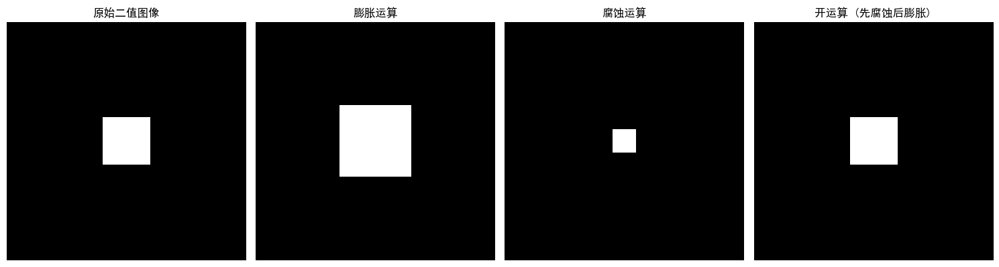

形态学运算分析:
- 膨胀运算使白色区域扩大
- 腐蚀运算使白色区域缩小
- 开运算能去除小的噪声点，平滑边界

2. 灰度形态学运算


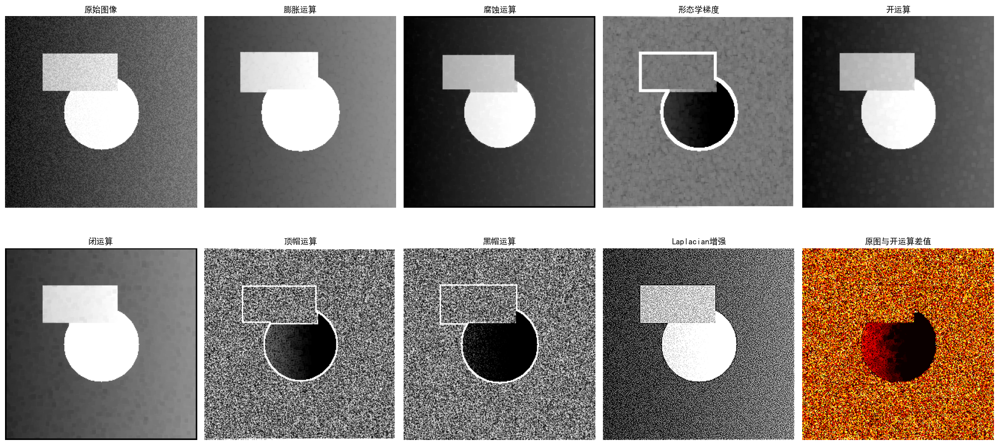

灰度形态学运算效果:
- 膨胀使亮区域扩大，暗区域缩小
- 腐蚀使亮区域缩小，暗区域扩大
- 形态学梯度突出了边缘和轮廓
- 开运算去除小的亮噪声
- 闭运算填补小的暗洞
- 顶帽运算提取小的亮细节
- 黑帽运算提取小的暗细节

3. 击中-击不中变换
测试图像包含T形结构
(30, 30, 2)


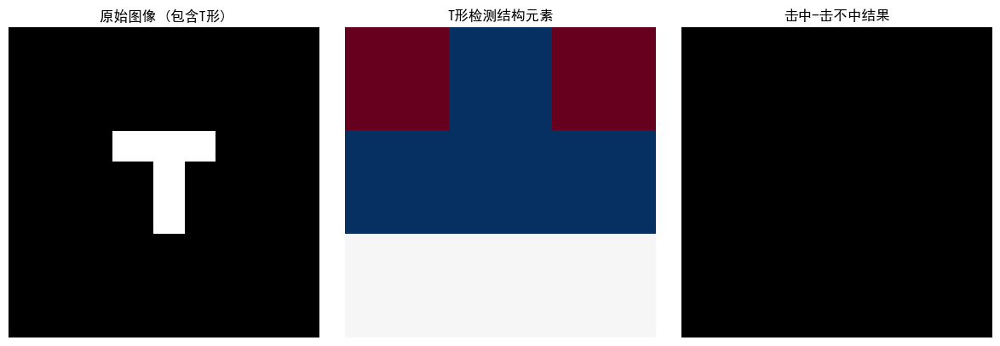

击中-击不中变换能够检测特定的形状模式

=== 形态学运算实验总结 ===
1. 成功验证了膨胀、腐蚀的基本功能
2. 开运算和闭运算在图像去噪和孔洞填充方面效果明显
3. 形态学梯度能有效提取边缘信息
4. 顶帽和黑帽运算能提取图像的细节特征
5. 击中-击不中变换可用于特定模式的检测



In [57]:
# 形态学运算综合实验
print("=== 形态学运算综合实验 ===")
print()

# 1. 膨胀和腐蚀运算验证
print("1. 膨胀和腐蚀运算")

# 创建一个简单的二值图像进行测试
binary_test = np.zeros((20, 20), dtype=bool)
binary_test[8:12, 8:12] = True  # 4x4白色方块

print(f"原始二值图像大小: {binary_test.shape}")
print("原始二值图像 (True表示白色像素):")
print(binary_test[6:14, 6:14].astype(int))
print()

# 3x3结构元素
se_3x3 = np.ones((3,3))

# 膨胀运算
dilated = dilate(binary_test, se_3x3)
print("膨胀运算结果:")
print(dilated[6:14, 6:14].astype(int))
print()

# 腐蚀运算
eroded = erosion(binary_test, se_3x3)
print("腐蚀运算结果:")
print(eroded[6:14, 6:14].astype(int))
print()

# 可视化二值形态学运算
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(binary_test, cmap='gray', vmin=0, vmax=1)
plt.title('原始二值图像')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(dilated, cmap='gray', vmin=0, vmax=1)
plt.title('膨胀运算')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(eroded, cmap='gray', vmin=0, vmax=1)
plt.title('腐蚀运算')
plt.axis('off')

# 膨胀和腐蚀的组合 - 开运算
opened = mopen(binary_test, se_3x3)
plt.subplot(1, 4, 4)
plt.imshow(opened, cmap='gray', vmin=0, vmax=1)
plt.title('开运算 (先腐蚀后膨胀)')
plt.axis('off')

plt.tight_layout()
plt.show()

print("形态学运算分析:")
print("- 膨胀运算使白色区域扩大")
print("- 腐蚀运算使白色区域缩小")
print("- 开运算能去除小的噪声点，平滑边界")
print()

# 2. 灰度形态学运算
print("2. 灰度形态学运算")

try:
    img = Image.open('./images/lena256.png').convert('L')
    gray_img = np.array(img)
    
    # 使用5x5结构元素
    se_5x5 = np.ones((5,5))
    
    # 灰度膨胀和腐蚀
    gray_dilated = dilate(gray_img, se_5x5)
    gray_eroded = erosion(gray_img, se_5x5)
    
    # 形态学梯度
    morph_gradient = mgradient(gray_img, se_5x5)
    
    # 开运算和闭运算
    opened_gray = mopen(gray_img, se_5x5)
    closed_gray = mclose(gray_img, se_5x5)
    
    # 顶帽和黑帽运算
    top_hat = tophat(gray_img, se_5x5)
    black_hat = blackhat(gray_img, se_5x5)
    
    plt.figure(figsize=(20, 10))
    
    plt.subplot(2, 5, 1)
    plt.imshow(gray_img, cmap='gray', vmin=0, vmax=255)
    plt.title('原始图像')
    plt.axis('off')
    
    plt.subplot(2, 5, 2)
    plt.imshow(gray_dilated, cmap='gray', vmin=0, vmax=255)
    plt.title('膨胀运算')
    plt.axis('off')
    
    plt.subplot(2, 5, 3)
    plt.imshow(gray_eroded, cmap='gray', vmin=0, vmax=255)
    plt.title('腐蚀运算')
    plt.axis('off')
    
    plt.subplot(2, 5, 4)
    plt.imshow(morph_gradient, cmap='gray', vmin=0, vmax=100)
    plt.title('形态学梯度')
    plt.axis('off')
    
    plt.subplot(2, 5, 5)
    plt.imshow(opened_gray, cmap='gray', vmin=0, vmax=255)
    plt.title('开运算')
    plt.axis('off')
    
    plt.subplot(2, 5, 6)
    plt.imshow(closed_gray, cmap='gray', vmin=0, vmax=255)
    plt.title('闭运算')
    plt.axis('off')
    
    plt.subplot(2, 5, 7)
    plt.imshow(top_hat, cmap='gray', vmin=0, vmax=50)
    plt.title('顶帽运算')
    plt.axis('off')
    
    plt.subplot(2, 5, 8)
    plt.imshow(black_hat, cmap='gray', vmin=0, vmax=50)
    plt.title('黑帽运算')
    plt.axis('off')
    
    # 边缘增强的Laplacian
    laplacian_enhance = np.array([[0, -1, 0],
                                 [-1, 5, -1],
                                 [0, -1, 0]])
    enhanced = conv2d(gray_img, laplacian_enhance)
    plt.subplot(2, 5, 9)
    plt.imshow(enhanced, cmap='gray', vmin=0, vmax=255)
    plt.title('Laplacian增强')
    plt.axis('off')
    
    plt.subplot(2, 5, 10)
    plt.imshow(np.abs(gray_img.astype(np.float32) - opened_gray.astype(np.float32)), cmap='hot', vmin=0, vmax=50)
    plt.title('原图与开运算差值')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("灰度形态学运算效果:")
    print("- 膨胀使亮区域扩大，暗区域缩小")
    print("- 腐蚀使亮区域缩小，暗区域扩大")
    print("- 形态学梯度突出了边缘和轮廓")
    print("- 开运算去除小的亮噪声")
    print("- 闭运算填补小的暗洞")
    print("- 顶帽运算提取小的亮细节")
    print("- 黑帽运算提取小的暗细节")
    print()

except FileNotFoundError:
    print("使用随机图像进行灰度形态学演示")
    # 创建测试图像
    test_gray = np.random.randint(50, 200, (50, 50)).astype(np.uint8)
    test_gray[20:30, 20:30] = 255  # 亮区域
    
    se_test = np.ones((3,3))
    dilated_test = dilate(test_gray, se_test)
    
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(test_gray, cmap='gray')
    plt.title('测试图像')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(dilated_test, cmap='gray')
    plt.title('膨胀运算')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    print()

# 3. 击中-击不中变换演示
print("3. 击中-击不中变换")

# 创建特定模式的二值图像
pattern_img = np.zeros((30, 30), dtype=bool)
# 创建一些T形结构
pattern_img[10:13, 10:20] = True  # 水平线
pattern_img[10:20, 14:17] = True  # 垂直线

print("测试图像包含T形结构")

# 定义T形检测的击中-击不中结构元素
t_pattern = np.array([[-1, 1, -1],
                      [ 1, 1,  1],
                      [ 0, 0,  0]])

# 应用击中-击不中变换
hit_miss_result = hitmiss(pattern_img, t_pattern)

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(pattern_img, cmap='gray', vmin=0, vmax=1)
plt.title('原始图像 (包含T形)')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(t_pattern, cmap='RdBu', vmin=-1, vmax=1)
plt.title('T形检测结构元素')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(hit_miss_result, cmap='gray', vmin=0, vmax=1)
plt.title('击中-击不中结果')
plt.axis('off')

plt.tight_layout()
plt.show()

print("击中-击不中变换能够检测特定的形状模式")
print()

print("=== 形态学运算实验总结 ===")
print("1. 成功验证了膨胀、腐蚀的基本功能")
print("2. 开运算和闭运算在图像去噪和孔洞填充方面效果明显")
print("3. 形态学梯度能有效提取边缘信息")
print("4. 顶帽和黑帽运算能提取图像的细节特征")
print("5. 击中-击不中变换可用于特定模式的检测")
print()

---

## 5. 找不同实验 - 邻域运算后处理

### 实验目的
使用形态学运算对图像差分结果进行后处理，提高"找不同"的准确性和可视化效果。

### 实验步骤